In [ ]:
from google.colab import files
import zipfile
import os

uploaded = files.upload()  # a file picker will pop up — select your goat_dataset.zip

zip_filename = list(uploaded.keys())[0]
extract_path = '/content/goat_dataset'

with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Count images per class
for class_name in sorted(os.listdir(extract_path)):
    class_dir = os.path.join(extract_path, class_name)
    if os.path.isdir(class_dir):
        count = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        print(f"{class_name}: {count} images")

Saving Goat.zip to Goat.zip
Goat: 0 images


In [ ]:
for root, dirs, files_ in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    if level >= 2:  # don't spam every filename, just confirm files exist
        img_count = len([f for f in files_ if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        if img_count:
            print(f"{indent}  ({img_count} images)")

goat_dataset/
  Goat/
    pink eye/
      (354 images)
    mange/
      (1798 images)
    healthy/
      (422 images)
    cheesy gland/
      (751 images)
    scabies/
      (400 images)


In [ ]:
import os
import random
import shutil

random.seed(42)

source_root = '/content/goat_dataset/Goat'
balanced_root = '/content/goat_balanced'
target_per_class = 350

if os.path.exists(balanced_root):
    shutil.rmtree(balanced_root)
os.makedirs(balanced_root)

for class_name in sorted(os.listdir(source_root)):
    class_dir = os.path.join(source_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    sampled = random.sample(images, min(target_per_class, len(images)))

    dest_dir = os.path.join(balanced_root, class_name.replace(' ', '_'))
    os.makedirs(dest_dir, exist_ok=True)
    for img in sampled:
        shutil.copy(os.path.join(class_dir, img), os.path.join(dest_dir, img))

    print(f"{class_name}: sampled {len(sampled)} of {len(images)} images")

cheesy gland: sampled 350 of 751 images
healthy: sampled 350 of 422 images
mange: sampled 350 of 1798 images
pink eye: sampled 350 of 354 images
scabies: sampled 350 of 400 images


In [ ]:
import os
import random
import shutil

random.seed(42)

balanced_root = '/content/goat_balanced'
split_root = '/content/goat_split'
splits = {'train': 0.8, 'val': 0.1, 'test': 0.1}

if os.path.exists(split_root):
    shutil.rmtree(split_root)

for split_name in splits:
    os.makedirs(os.path.join(split_root, split_name), exist_ok=True)

for class_name in sorted(os.listdir(balanced_root)):
    class_dir = os.path.join(balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue

    images = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    random.shuffle(images)

    n_total = len(images)
    n_train = int(n_total * splits['train'])
    n_val = int(n_total * splits['val'])

    split_files = {
        'train': images[:n_train],
        'val': images[n_train:n_train + n_val],
        'test': images[n_train + n_val:]
    }

    for split_name, files_list in split_files.items():
        dest_dir = os.path.join(split_root, split_name, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for img in files_list:
            shutil.copy(os.path.join(class_dir, img), os.path.join(dest_dir, img))

    print(f"{class_name}: train={len(split_files['train'])}, val={len(split_files['val'])}, test={len(split_files['test'])}")

cheesy_gland: train=280, val=35, test=35
healthy: train=280, val=35, test=35
mange: train=280, val=35, test=35
pink_eye: train=280, val=35, test=35
scabies: train=280, val=35, test=35


In [ ]:
import tensorflow as tf

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
split_root = '/content/goat_split'

train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'train'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=True,
    seed=42
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'val'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'test'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

class_names = train_ds.class_names
print("Classes (in label order):", class_names)

data_augmentation = tf.keras.Sequential(name="data_augmentation")
data_augmentation.add(tf.keras.layers.RandomFlip('horizontal'))
data_augmentation.add(tf.keras.layers.RandomRotation(0.15))
data_augmentation.add(tf.keras.layers.RandomZoom(0.15))
data_augmentation.add(tf.keras.layers.RandomContrast(0.1))

preprocess_input = tf.keras.applications.efficientnet.preprocess_input

def prep_train(x, y):
    x = data_augmentation(x)
    x = preprocess_input(x)
    return x, y

def prep_eval(x, y):
    x = preprocess_input(x)
    return x, y

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds = val_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds = test_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Pipelines ready.")

Found 1400 files belonging to 5 classes.
Found 175 files belonging to 5 classes.
Found 175 files belonging to 5 classes.
Classes (in label order): ['cheesy_gland', 'healthy', 'mange', 'pink_eye', 'scabies']
Pipelines ready.


In [ ]:
from tensorflow.keras import layers, models

base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # freeze base for initial training

inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_best.keras', monitor='val_accuracy', save_best_only=True)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=callbacks
)

Epoch 1/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 83s 1s/step - accuracy: 0.6386 - loss: 0.8557 - val_accuracy: 0.7600 - val_loss: 0.5398
Epoch 2/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 377ms/step - accuracy: 0.8093 - loss: 0.4669 - val_accuracy: 0.7943 - val_loss: 0.4576
Epoch 3/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 18s 401ms/step - accuracy: 0.8221 - loss: 0.4070 - val_accuracy: 0.8114 - val_loss: 0.3919
Epoch 4/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 378ms/step - accuracy: 0.8479 - loss: 0.3535 - val_accuracy: 0.7543 - val_loss: 0.4096
Epoch 5/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 389ms/step - accuracy: 0.8457 - loss: 0.3467 - val_accuracy: 0.8229 - val_loss: 0.3545
Epoch 6/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 380ms/step - accuracy: 0.8479 - loss: 0.3403 - val_accuracy: 0.8057 - val_loss: 0.3687
Epoch 7/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 374ms/step - accuracy: 0.8557 - loss: 0.3322 - val_accuracy: 0.8457 - val_loss: 0.3600
Epoch 8/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 364ms/step - accuracy: 0.8743 - loss: 0.2867 - val_accurac

In [ ]:
base_model.trainable = True

# Freeze all layers except the last ~20 (fine-tune only the deeper feature layers)
fine_tune_at = len(base_model.layers) - 20
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

fine_tune_callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_finetuned.keras', monitor='val_accuracy', save_best_only=True)
]

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=fine_tune_callbacks
)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 1,515,573 (5.78 MB)

 Non-trainable params: 2,698,611 (10.29 MB)

Epoch 1/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 73s 988ms/step - accuracy: 0.8029 - loss: 0.5077 - val_accuracy: 0.8400 - val_loss: 0.3629
Epoch 2/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 364ms/step - accuracy: 0.8279 - loss: 0.4600 - val_accuracy: 0.8400 - val_loss: 0.3644
Epoch 3/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 18s 391ms/step - accuracy: 0.8300 - loss: 0.4412 - val_accuracy: 0.8400 - val_loss: 0.3670
Epoch 4/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 374ms/step - accuracy: 0.8300 - loss: 0.4315 - val_accuracy: 0.8343 - val_loss: 0.3652
Epoch 5/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 371ms/step - accuracy: 0.8350 - loss: 0.4103 - val_accuracy: 0.8286 - val_loss: 0.3657
Epoch 6/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 385ms/step - accuracy: 0.8379 - loss: 0.4083 - val_accuracy: 0.8286 - val_loss: 0.3640
Epoch 7/20
44/44 ━━━━━━━━━━━━━━━━━━━━ 19s 357ms/step - accuracy: 0.8507 - loss: 0.3708 - val_accuracy: 0.8171 - val_loss: 0.3621


In [ ]:
model_frozen = tf.keras.models.load_model('/content/goat_model_best.keras')
model_finetuned = tf.keras.models.load_model('/content/goat_model_finetuned.keras')

print("Frozen-base model:")
frozen_loss, frozen_acc = model_frozen.evaluate(test_ds)
print(f"Test accuracy: {frozen_acc:.4f}")

print("\nFine-tuned model:")
ft_loss, ft_acc = model_finetuned.evaluate(test_ds)
print(f"Test accuracy: {ft_acc:.4f}")

Frozen-base model:
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 945ms/step - accuracy: 0.8343 - loss: 0.3734
Test accuracy: 0.8343

Fine-tuned model:
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 935ms/step - accuracy: 0.8343 - loss: 0.3696
Test accuracy: 0.8343


              precision    recall  f1-score   support

cheesy_gland       0.97      0.97      0.97        35
     healthy       0.97      0.97      0.97        35
       mange       0.73      0.46      0.56        35
    pink_eye       0.97      0.97      0.97        35
     scabies       0.58      0.80      0.67        35

    accuracy                           0.83       175
   macro avg       0.84      0.83      0.83       175
weighted avg       0.84      0.83      0.83       175



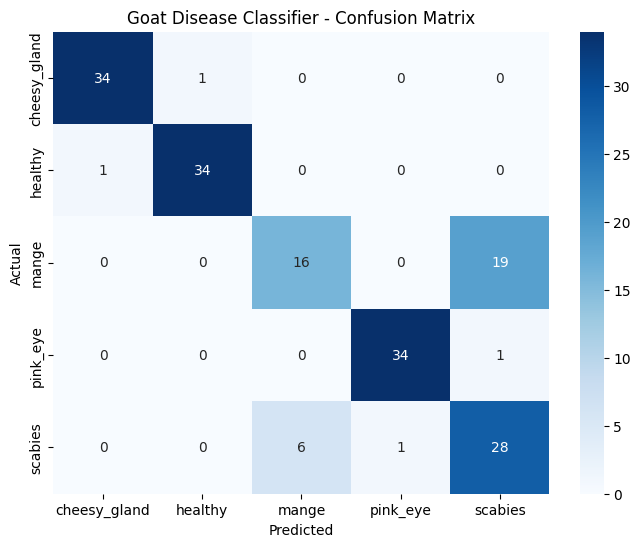

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model_frozen.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Goat Disease Classifier - Confusion Matrix')
plt.show()

Found 175 files belonging to 5 classes.
Found 19 mange->scabies mismatches


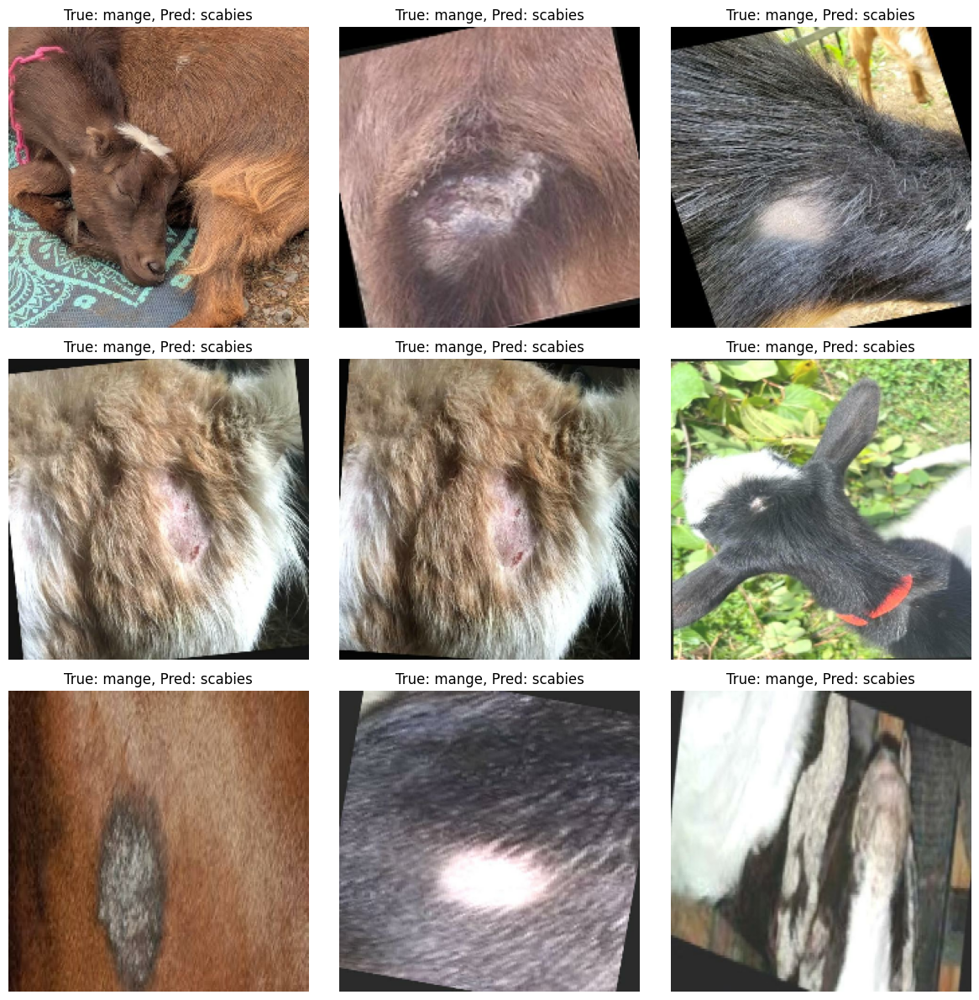

In [ ]:
import matplotlib.pyplot as plt

# Rebuild a raw (unprocessed) version of the test set, same order (shuffle=False)
raw_test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'test'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

mange_idx = class_names.index('mange')
scabies_idx = class_names.index('scabies')

mismatches = []
for (raw_images, labels), (proc_images, _) in zip(raw_test_ds, test_ds):
    preds = model_frozen.predict(proc_images, verbose=0)
    true_labels = np.argmax(labels.numpy(), axis=1)
    pred_labels = np.argmax(preds, axis=1)
    for i in range(len(true_labels)):
        if true_labels[i] == mange_idx and pred_labels[i] == scabies_idx:
            mismatches.append(raw_images[i].numpy().astype('uint8'))

print(f"Found {len(mismatches)} mange->scabies mismatches")

n_show = min(9, len(mismatches))
plt.figure(figsize=(12, 12))
for i in range(n_show):
    plt.subplot(3, 3, i + 1)
    plt.imshow(mismatches[i])
    plt.title("True: mange, Pred: scabies")
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
!pip install imagehash -q

import imagehash
from PIL import Image

hashes = {}
duplicates = []

for class_name in sorted(os.listdir(balanced_root)):
    class_dir = os.path.join(balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    for fname in os.listdir(class_dir):
        fpath = os.path.join(class_dir, fname)
        try:
            h = imagehash.phash(Image.open(fpath))
        except Exception:
            continue
        key = str(h)
        if key in hashes:
            duplicates.append((hashes[key], (class_name, fname)))
        else:
            hashes[key] = (class_name, fname)

print(f"Found {len(duplicates)} duplicate/near-duplicate pairs")
for d in duplicates[:30]:
    print(d)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 7.4 MB/s eta 0:00:00
Found 380 duplicate/near-duplicate pairs
(('cheesy_gland', 'train_caseous_lymphadenitis_7_jpg.rf.c8be4e49e2306bc48dcb4c612849c2db.jpg'), ('cheesy_gland', 'train_caseous_lymphadenitis_7_jpg.rf.b3ff531847607db2f9d967dbbe3fb422.jpg'))
(('cheesy_gland', 'train_caseous_lymphadenitis_7_jpg.rf.c8be4e49e2306bc48dcb4c612849c2db.jpg'), ('cheesy_gland', 'train_caseous_lymphadenitis_7_jpg.rf.13371a532f9259fb77a77c8e0ed89ac8.jpg'))
(('cheesy_gland', 'test_caseous_lymphadenitis_38_jpg.rf.a8d3fbfc748f98f4929d77ca8adbeabf.jpg'), ('cheesy_gland', 'test_caseous_lymphadenitis_38_jpg.rf.d9be2d67972e6e393a38ffe2dbe8625f.jpg'))
(('cheesy_gland', 'train_caseous_lymphadenitis_34_aug2_jpg.rf.b3d32fd470aa709ad0157c03d74f112b.jpg'), ('cheesy_gland', 'train_caseous_lymphadenitis_34_aug2_jpg.rf.4a61e8e090838cb3eb20f76ea7062106.jpg'))
(('cheesy_gland', 'train_caseous_lymphadenitis_37_jpg.rf.86b41ae07108ae6c26a43a7209082eeb.jpg'), ('chee

In [ ]:
import re
from collections import defaultdict

def get_base_id(filename):
    # Strip Roboflow split prefix, optional _augN, and the _jpg.rf.<hash>.jpg suffix
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

# Check leakage in the CURRENT split
leak_groups = defaultdict(set)  # (class, base_id) -> set of splits it appears in

for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(split_root, split_name)):
        class_dir = os.path.join(split_root, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            base_id = get_base_id(fname)
            leak_groups[(class_name, base_id)].add(split_name)

leaked = {k: v for k, v in leak_groups.items() if len(v) > 1}
print(f"Total source-image groups: {len(leak_groups)}")
print(f"Groups leaking across splits: {len(leaked)}")
for k, v in list(leaked.items())[:15]:
    print(k, v)

Total source-image groups: 310
Groups leaking across splits: 172
('pink_eye', '1-s2-0-S2405939024000753-gr4') {'train', 'test'}
('pink_eye', 'Copy-of-00000003-1-') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-00000015-1-') {'train', 'test'}
('pink_eye', 'Copy-of-00000014') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-00000004-1-') {'train', 'test', 'val'}
('pink_eye', 'images-12-') {'train', 'test'}
('pink_eye', 'Copy-of-00000014-1-') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-00000008') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-00000016') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-00000004') {'train', 'test'}
('pink_eye', 'Copy-of-00000007') {'train', 'test'}
('pink_eye', 'Copy-of-00000006') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-00000001') {'train', 'test', 'val'}
('pink_eye', 'Copy-of-0000000-2-') {'train', 'test'}
('pink_eye', 'Copy-of-00000012') {'train', 'test'}


In [ ]:
import re
import random
from collections import defaultdict
import shutil

random.seed(42)

def get_base_id(filename):
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

split_root = '/content/goat_split'
splits = {'train': 0.8, 'val': 0.1, 'test': 0.1}

if os.path.exists(split_root):
    shutil.rmtree(split_root)
for split_name in splits:
    os.makedirs(os.path.join(split_root, split_name), exist_ok=True)

for class_name in sorted(os.listdir(balanced_root)):
    class_dir = os.path.join(balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue

    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if not fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        groups[get_base_id(fname)].append(fname)

    group_ids = list(groups.keys())
    random.shuffle(group_ids)

    total_images = sum(len(v) for v in groups.values())
    target_train = int(total_images * splits['train'])
    target_val = int(total_images * splits['val'])

    running_count = {'train': 0, 'val': 0, 'test': 0}
    for gid in group_ids:
        n = len(groups[gid])
        if running_count['train'] < target_train:
            dest_split = 'train'
        elif running_count['val'] < target_val:
            dest_split = 'val'
        else:
            dest_split = 'test'
        running_count[dest_split] += n

        dest_dir = os.path.join(split_root, dest_split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for fname in groups[gid]:
            shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))

    print(f"{class_name}: {len(group_ids)} source groups -> train={running_count['train']}, val={running_count['val']}, test={running_count['test']}")

cheesy_gland: 48 source groups -> train=284, val=36, test=30
healthy: 53 source groups -> train=282, val=37, test=31
mange: 98 source groups -> train=280, val=35, test=35
pink_eye: 26 source groups -> train=290, val=36, test=24
scabies: 85 source groups -> train=281, val=38, test=31


In [ ]:
import re
from collections import defaultdict

def get_base_id(filename):
    # Strip Roboflow split prefix, optional _augN, and the _jpg.rf.<hash>.jpg suffix
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

# Check leakage in the CURRENT split
leak_groups = defaultdict(set)  # (class, base_id) -> set of splits it appears in

for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(split_root, split_name)):
        class_dir = os.path.join(split_root, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            base_id = get_base_id(fname)
            leak_groups[(class_name, base_id)].add(split_name)

leaked = {k: v for k, v in leak_groups.items() if len(v) > 1}
print(f"Total source-image groups: {len(leak_groups)}")
print(f"Groups leaking across splits: {len(leaked)}")
for k, v in list(leaked.items())[:15]:
    print(k, v)

Total source-image groups: 310
Groups leaking across splits: 0


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'train'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=True,
    seed=42
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'val'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'test'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

class_names = train_ds.class_names
print("Classes (in label order):", class_names)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds = val_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds = test_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Pipelines rebuilt on clean split.")

Found 1417 files belonging to 5 classes.
Found 182 files belonging to 5 classes.
Found 151 files belonging to 5 classes.
Classes (in label order): ['cheesy_gland', 'healthy', 'mange', 'pink_eye', 'scabies']
Pipelines rebuilt on clean split.


In [ ]:
base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False

inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_best.keras', monitor='val_accuracy', save_best_only=True)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=callbacks
)

Epoch 1/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.6620 - loss: 0.8247 - val_accuracy: 0.6374 - val_loss: 0.7333
Epoch 2/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 18s 391ms/step - accuracy: 0.8172 - loss: 0.4475 - val_accuracy: 0.6099 - val_loss: 0.8142
Epoch 3/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 16s 355ms/step - accuracy: 0.8546 - loss: 0.3702 - val_accuracy: 0.5330 - val_loss: 0.8887
Epoch 4/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 21s 360ms/step - accuracy: 0.8631 - loss: 0.3240 - val_accuracy: 0.5549 - val_loss: 0.8868
Epoch 5/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 350ms/step - accuracy: 0.8589 - loss: 0.3085 - val_accuracy: 0.6209 - val_loss: 0.8510
Epoch 6/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 22s 382ms/step - accuracy: 0.8659 - loss: 0.2917 - val_accuracy: 0.6209 - val_loss: 0.9452


In [ ]:
import re
from collections import defaultdict

def get_base_id(filename):
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

source_root = '/content/goat_dataset/Goat'

for class_name in sorted(os.listdir(source_root)):
    class_dir = os.path.join(source_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    files = [f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    unique_ids = set(get_base_id(f) for f in files)
    print(f"{class_name}: {len(files)} raw images -> {len(unique_ids)} unique source photos")

cheesy gland: 751 raw images -> 56 unique source photos
healthy: 422 raw images -> 54 unique source photos
mange: 1798 raw images -> 152 unique source photos
pink eye: 354 raw images -> 26 unique source photos
scabies: 400 raw images -> 88 unique source photos


In [ ]:
from google.colab import files
import zipfile

uploaded2 = files.upload()  # select your orf/contagious_ecthyma zip

orf_zip = list(uploaded2.keys())[0]
orf_extract_path = '/content/orf_dataset'

with zipfile.ZipFile(orf_zip, 'r') as zip_ref:
    zip_ref.extractall(orf_extract_path)

for root, dirs, fs in os.walk(orf_extract_path):
    level = root.replace(orf_extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    imgs = [f for f in fs if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if imgs:
        print(f"{indent}  ({len(imgs)} images)")

Saving Goat (2).zip to Goat (2).zip
orf_dataset/
  Goat/
    pink eye/
      (354 images)
    mange/
      (1798 images)
    healthy/
      (422 images)
    cheesy gland/
      (751 images)
    scabies/
      (400 images)
    Contagious ecthyma/
      (1183 images)


In [ ]:
import re

def get_base_id(filename):
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

orf_class_dir = '/content/orf_dataset/Goat/Contagious ecthyma'
files_orf = [f for f in os.listdir(orf_class_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
unique_ids_orf = set(get_base_id(f) for f in files_orf)

print(f"Contagious ecthyma: {len(files_orf)} raw images -> {len(unique_ids_orf)} unique source photos")

Contagious ecthyma: 1183 raw images -> 122 unique source photos


In [ ]:
combined_root = '/content/goat_combined'
if os.path.exists(combined_root):
    shutil.rmtree(combined_root)
os.makedirs(combined_root)

sources = {
    '/content/goat_dataset/Goat/cheesy gland': 'cheesy_gland',
    '/content/goat_dataset/Goat/mange': 'mange',
    '/content/goat_dataset/Goat/healthy': 'healthy',
    '/content/goat_dataset/Goat/scabies': 'scabies',
    '/content/orf_dataset/Goat/Contagious ecthyma': 'contagious_ecthyma',
}

for src_dir, dest_name in sources.items():
    dest_dir = os.path.join(combined_root, dest_name)
    os.makedirs(dest_dir, exist_ok=True)
    count = 0
    for fname in os.listdir(src_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            shutil.copy(os.path.join(src_dir, fname), os.path.join(dest_dir, fname))
            count += 1
    print(f"{dest_name}: copied {count} images")

cheesy_gland: copied 751 images
mange: copied 1798 images
healthy: copied 422 images
scabies: copied 400 images
contagious_ecthyma: copied 1183 images


In [ ]:
import re
import random
from collections import defaultdict

random.seed(42)

def get_base_id(filename):
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

def balanced_sample(class_dir, target):
    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)

    group_ids = list(groups.keys())
    random.shuffle(group_ids)
    for gid in group_ids:
        random.shuffle(groups[gid])

    selected = []
    idx = {gid: 0 for gid in group_ids}
    while len(selected) < target:
        progress = False
        for gid in group_ids:
            if len(selected) >= target:
                break
            i = idx[gid]
            if i < len(groups[gid]):
                selected.append(groups[gid][i])
                idx[gid] += 1
                progress = True
        if not progress:
            break  # exhausted every copy of every photo in this class
    return selected, len(group_ids)

balanced_root = '/content/goat_balanced'
if os.path.exists(balanced_root):
    shutil.rmtree(balanced_root)
os.makedirs(balanced_root)

target_per_class = 350

for class_name in sorted(os.listdir(combined_root)):
    class_dir = os.path.join(combined_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    sampled, n_unique = balanced_sample(class_dir, target_per_class)

    dest_dir = os.path.join(balanced_root, class_name)
    os.makedirs(dest_dir, exist_ok=True)
    for fname in sampled:
        shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))

    avg_reuse = len(sampled) / n_unique
    print(f"{class_name}: {len(sampled)} images sampled from {n_unique} unique photos (avg {avg_reuse:.1f}x reuse)")

cheesy_gland: 350 images sampled from 56 unique photos (avg 6.2x reuse)
contagious_ecthyma: 350 images sampled from 122 unique photos (avg 2.9x reuse)
healthy: 350 images sampled from 54 unique photos (avg 6.5x reuse)
mange: 350 images sampled from 152 unique photos (avg 2.3x reuse)
scabies: 350 images sampled from 88 unique photos (avg 4.0x reuse)


In [ ]:
if os.path.exists(split_root):
    shutil.rmtree(split_root)
for split_name in splits:
    os.makedirs(os.path.join(split_root, split_name), exist_ok=True)

for class_name in sorted(os.listdir(balanced_root)):
    class_dir = os.path.join(balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue

    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)

    group_ids = list(groups.keys())
    random.shuffle(group_ids)

    total_images = sum(len(v) for v in groups.values())
    target_train = int(total_images * splits['train'])
    target_val = int(total_images * splits['val'])

    running_count = {'train': 0, 'val': 0, 'test': 0}
    for gid in group_ids:
        n = len(groups[gid])
        if running_count['train'] < target_train:
            dest_split = 'train'
        elif running_count['val'] < target_val:
            dest_split = 'val'
        else:
            dest_split = 'test'
        running_count[dest_split] += n

        dest_dir = os.path.join(split_root, dest_split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for fname in groups[gid]:
            shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))

    print(f"{class_name}: {len(group_ids)} source groups -> train={running_count['train']}, val={running_count['val']}, test={running_count['test']}")

cheesy_gland: 56 source groups -> train=290, val=43, test=17
contagious_ecthyma: 122 source groups -> train=282, val=36, test=32
healthy: 54 source groups -> train=281, val=41, test=28
mange: 152 source groups -> train=281, val=37, test=32
scabies: 88 source groups -> train=280, val=36, test=34


In [ ]:
import re
from collections import defaultdict

def get_base_id(filename):
    # Strip Roboflow split prefix, optional _augN, and the _jpg.rf.<hash>.jpg suffix
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

# Check leakage in the CURRENT split
leak_groups = defaultdict(set)  # (class, base_id) -> set of splits it appears in

for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(split_root, split_name)):
        class_dir = os.path.join(split_root, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            base_id = get_base_id(fname)
            leak_groups[(class_name, base_id)].add(split_name)

leaked = {k: v for k, v in leak_groups.items() if len(v) > 1}
print(f"Total source-image groups: {len(leak_groups)}")
print(f"Groups leaking across splits: {len(leaked)}")
for k, v in list(leaked.items())[:15]:
    print(k, v)

Total source-image groups: 472
Groups leaking across splits: 0


In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'train'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=True,
    seed=42
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'val'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'test'),
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical',
    shuffle=False
)

class_names = train_ds.class_names
print("Classes (in label order):", class_names)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds = val_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds = test_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Pipelines rebuilt.")

Found 1414 files belonging to 5 classes.
Found 193 files belonging to 5 classes.
Found 143 files belonging to 5 classes.
Classes (in label order): ['cheesy_gland', 'contagious_ecthyma', 'healthy', 'mange', 'scabies']
Pipelines rebuilt.


In [ ]:
base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False

inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_2      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_best.keras', monitor='val_accuracy', save_best_only=True)
]

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=25,
    callbacks=callbacks
)

Epoch 1/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.5948 - loss: 1.0221 - val_accuracy: 0.6684 - val_loss: 0.8655
Epoch 2/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 17s 379ms/step - accuracy: 0.7525 - loss: 0.6564 - val_accuracy: 0.6943 - val_loss: 0.7614
Epoch 3/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 18s 398ms/step - accuracy: 0.7878 - loss: 0.5325 - val_accuracy: 0.6684 - val_loss: 0.8022
Epoch 4/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 17s 363ms/step - accuracy: 0.8232 - loss: 0.4764 - val_accuracy: 0.6425 - val_loss: 0.8959
Epoch 5/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 24s 444ms/step - accuracy: 0.8161 - loss: 0.4417 - val_accuracy: 0.6373 - val_loss: 0.9561
Epoch 6/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 19s 418ms/step - accuracy: 0.8508 - loss: 0.3733 - val_accuracy: 0.6425 - val_loss: 0.9421
Epoch 7/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 18s 379ms/step - accuracy: 0.8487 - loss: 0.3591 - val_accuracy: 0.6321 - val_loss: 1.0728


In [ ]:
model_frozen = tf.keras.models.load_model('/content/goat_model_best.keras')

print("Frozen-base model (clean split):")
test_loss, test_acc = model_frozen.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.4f}")

NameError: name 'tf' is not defined

In [ ]:
import tensorflow as tf

model_frozen = tf.keras.models.load_model('/content/goat_model_best.keras')

print("Frozen-base model (clean split):")
test_loss, test_acc = model_frozen.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.4f}")

ValueError: File not found: filepath=/content/goat_model_best.keras. Please ensure the file is an accessible `.keras` zip file.

In [ ]:
from google.colab import files
import zipfile, os

uploaded = files.upload()  # select Goat.zip
zip_filename = list(uploaded.keys())[0]
extract_path = '/content/goat_dataset'
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Extracted:", os.listdir(os.path.join(extract_path, 'Goat')))

Saving Goat (2).zip to Goat (2).zip
Extracted: ['Contagious ecthyma', 'cheesy gland', 'scabies', 'mange', 'pink eye', 'healthy']


In [ ]:
import re, random, shutil
from collections import defaultdict

random.seed(42)

def get_base_id(filename):
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    return m.group(1) if m else filename

combined_root = '/content/goat_combined'
if os.path.exists(combined_root):
    shutil.rmtree(combined_root)
os.makedirs(combined_root)

sources = {
    '/content/goat_dataset/Goat/cheesy gland': 'cheesy_gland',
    '/content/goat_dataset/Goat/mange': 'mange',
    '/content/goat_dataset/Goat/healthy': 'healthy',
    '/content/goat_dataset/Goat/scabies': 'scabies',
    '/content/goat_dataset/Goat/Contagious ecthyma': 'contagious_ecthyma',
}
for src_dir, dest_name in sources.items():
    dest_dir = os.path.join(combined_root, dest_name)
    os.makedirs(dest_dir, exist_ok=True)
    for fname in os.listdir(src_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            shutil.copy(os.path.join(src_dir, fname), os.path.join(dest_dir, fname))

def balanced_sample(class_dir, target):
    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)
    group_ids = list(groups.keys())
    random.shuffle(group_ids)
    for gid in group_ids:
        random.shuffle(groups[gid])
    selected = []
    idx = {gid: 0 for gid in group_ids}
    while len(selected) < target:
        progress = False
        for gid in group_ids:
            if len(selected) >= target:
                break
            i = idx[gid]
            if i < len(groups[gid]):
                selected.append(groups[gid][i])
                idx[gid] += 1
                progress = True
        if not progress:
            break
    return selected, len(group_ids)

balanced_root = '/content/goat_balanced'
if os.path.exists(balanced_root):
    shutil.rmtree(balanced_root)
os.makedirs(balanced_root)

target_per_class = 350
for class_name in sorted(os.listdir(combined_root)):
    class_dir = os.path.join(combined_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    sampled, n_unique = balanced_sample(class_dir, target_per_class)
    dest_dir = os.path.join(balanced_root, class_name)
    os.makedirs(dest_dir, exist_ok=True)
    for fname in sampled:
        shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))
    print(f"{class_name}: {len(sampled)} images from {n_unique} unique photos (avg {len(sampled)/n_unique:.1f}x reuse)")

split_root = '/content/goat_split'
splits = {'train': 0.8, 'val': 0.1, 'test': 0.1}
if os.path.exists(split_root):
    shutil.rmtree(split_root)
for split_name in splits:
    os.makedirs(os.path.join(split_root, split_name), exist_ok=True)

for class_name in sorted(os.listdir(balanced_root)):
    class_dir = os.path.join(balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)
    group_ids = list(groups.keys())
    random.shuffle(group_ids)
    total_images = sum(len(v) for v in groups.values())
    target_train = int(total_images * splits['train'])
    target_val = int(total_images * splits['val'])
    running_count = {'train': 0, 'val': 0, 'test': 0}
    for gid in group_ids:
        n = len(groups[gid])
        if running_count['train'] < target_train:
            dest_split = 'train'
        elif running_count['val'] < target_val:
            dest_split = 'val'
        else:
            dest_split = 'test'
        running_count[dest_split] += n
        dest_dir = os.path.join(split_root, dest_split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for fname in groups[gid]:
            shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))
    print(f"{class_name}: {len(group_ids)} groups -> train={running_count['train']}, val={running_count['val']}, test={running_count['test']}")

leak_groups = defaultdict(set)
for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(split_root, split_name)):
        class_dir = os.path.join(split_root, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            leak_groups[(class_name, get_base_id(fname))].add(split_name)
leaked = {k: v for k, v in leak_groups.items() if len(v) > 1}
print(f"\nTotal source-image groups: {len(leak_groups)}")
print(f"Groups leaking across splits: {len(leaked)}")

cheesy_gland: 350 images from 56 unique photos (avg 6.2x reuse)
contagious_ecthyma: 350 images from 122 unique photos (avg 2.9x reuse)
healthy: 350 images from 54 unique photos (avg 6.5x reuse)
mange: 350 images from 152 unique photos (avg 2.3x reuse)
scabies: 350 images from 88 unique photos (avg 4.0x reuse)
cheesy_gland: 56 groups -> train=280, val=39, test=31
contagious_ecthyma: 122 groups -> train=280, val=35, test=35
healthy: 54 groups -> train=289, val=35, test=26
mange: 152 groups -> train=282, val=35, test=33
scabies: 88 groups -> train=282, val=38, test=30

Total source-image groups: 472
Groups leaking across splits: 0


In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'train'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=True, seed=42
)
val_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'val'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)
test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'test'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)

class_names = train_ds.class_names
print("Classes (in label order):", class_names)

data_augmentation = tf.keras.Sequential(name="data_augmentation")
data_augmentation.add(layers.RandomFlip('horizontal'))
data_augmentation.add(layers.RandomRotation(0.15))
data_augmentation.add(layers.RandomZoom(0.15))
data_augmentation.add(layers.RandomContrast(0.1))

preprocess_input = tf.keras.applications.efficientnet.preprocess_input

def prep_train(x, y):
    x = data_augmentation(x)
    x = preprocess_input(x)
    return x, y

def prep_eval(x, y):
    x = preprocess_input(x)
    return x, y

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds = val_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds = test_ds.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Pipelines ready.")

Found 1413 files belonging to 5 classes.
Found 182 files belonging to 5 classes.
Found 155 files belonging to 5 classes.
Classes (in label order): ['cheesy_gland', 'contagious_ecthyma', 'healthy', 'mange', 'scabies']
Pipelines ready.


In [ ]:
base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,), include_top=False, weights='imagenet'
)
base_model.trainable = False

inputs = tf.keras.Input(shape=IMG_SIZE + (3,))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(len(class_names), activation='softmax')(x)

model = models.Model(inputs, outputs)
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
              loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
callbacks = [
    EarlyStopping(monitor='val_accuracy', patience=5, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_best.keras', monitor='val_accuracy', save_best_only=True)
]
history = model.fit(train_ds, validation_data=val_ds, epochs=25, callbacks=callbacks)

Epoch 1/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - accuracy: 0.5810 - loss: 1.0652 - val_accuracy: 0.7088 - val_loss: 0.8897
Epoch 2/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 348ms/step - accuracy: 0.7523 - loss: 0.6298 - val_accuracy: 0.6758 - val_loss: 0.9868
Epoch 3/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 16s 346ms/step - accuracy: 0.7983 - loss: 0.4963 - val_accuracy: 0.6868 - val_loss: 0.8438
Epoch 4/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 17s 379ms/step - accuracy: 0.8231 - loss: 0.4251 - val_accuracy: 0.6923 - val_loss: 0.8059
Epoch 5/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 358ms/step - accuracy: 0.8209 - loss: 0.4103 - val_accuracy: 0.7033 - val_loss: 0.8893
Epoch 6/25
45/45 ━━━━━━━━━━━━━━━━━━━━ 20s 343ms/step - accuracy: 0.8592 - loss: 0.3593 - val_accuracy: 0.6868 - val_loss: 0.8596


In [ ]:
print("Frozen-base model (clean split):")
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test accuracy: {test_acc:.4f}")

Frozen-base model (clean split):
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - accuracy: 0.6323 - loss: 0.8899
Test accuracy: 0.6323


                    precision    recall  f1-score   support

      cheesy_gland       0.88      0.71      0.79        31
contagious_ecthyma       0.55      0.80      0.65        35
           healthy       0.70      0.81      0.75        26
             mange       0.42      0.33      0.37        33
           scabies       0.70      0.53      0.60        30

          accuracy                           0.63       155
         macro avg       0.65      0.64      0.63       155
      weighted avg       0.64      0.63      0.63       155



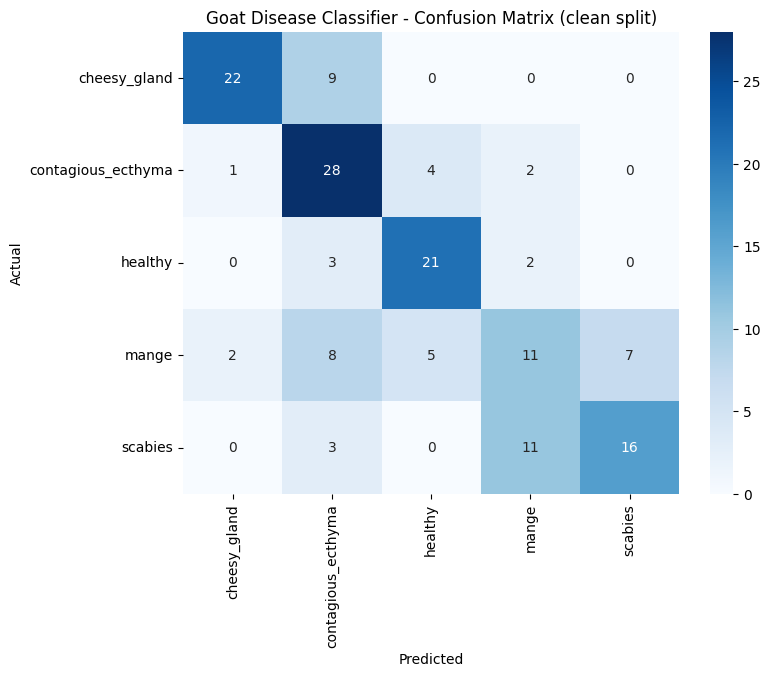

In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images, verbose=0)
    y_true.extend(np.argmax(labels.numpy(), axis=1))
    y_pred.extend(np.argmax(preds, axis=1))

y_true = np.array(y_true)
y_pred = np.array(y_pred)

print(classification_report(y_true, y_pred, target_names=class_names))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Goat Disease Classifier - Confusion Matrix (clean split)')
plt.show()

Found 155 files belonging to 5 classes.


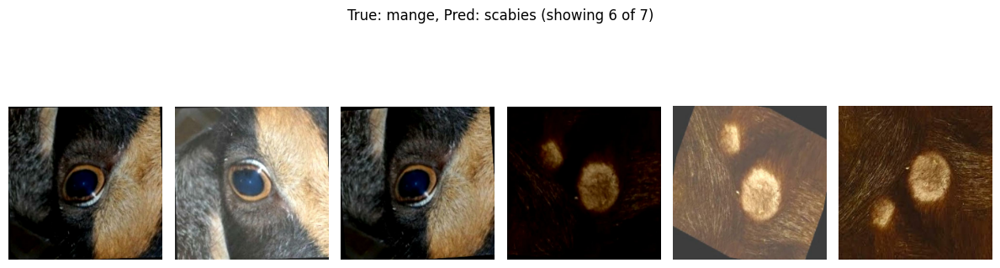

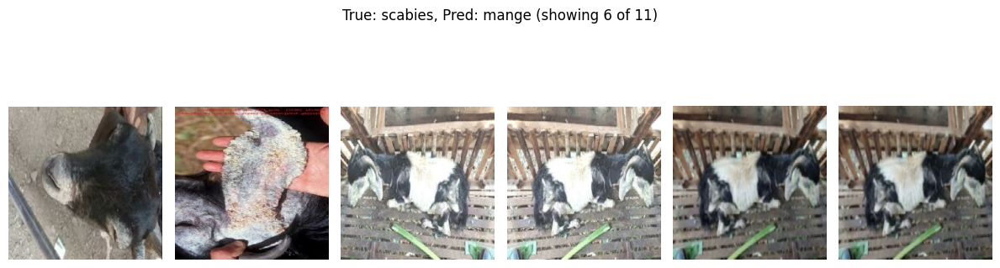

In [ ]:
raw_test_ds = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root, 'test'),
    image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)

mange_idx = class_names.index('mange')
scabies_idx = class_names.index('scabies')

mange_as_scabies = []
scabies_as_mange = []

for (raw_images, labels), (proc_images, _) in zip(raw_test_ds, test_ds):
    preds = model.predict(proc_images, verbose=0)
    true_labels = np.argmax(labels.numpy(), axis=1)
    pred_labels = np.argmax(preds, axis=1)
    for i in range(len(true_labels)):
        if true_labels[i] == mange_idx and pred_labels[i] == scabies_idx:
            mange_as_scabies.append(raw_images[i].numpy().astype('uint8'))
        elif true_labels[i] == scabies_idx and pred_labels[i] == mange_idx:
            scabies_as_mange.append(raw_images[i].numpy().astype('uint8'))

def show_grid(imgs, title, n=6):
    n = min(n, len(imgs))
    plt.figure(figsize=(12, 4))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(imgs[i])
        plt.axis('off')
    plt.suptitle(f"{title} (showing {n} of {len(imgs)})")
    plt.tight_layout()
    plt.show()

show_grid(mange_as_scabies, "True: mange, Pred: scabies")
show_grid(scabies_as_mange, "True: scabies, Pred: mange")

In [ ]:
from google.colab import files
import zipfile, os

uploaded3 = files.upload()  # select Lice infection / Ringworm zip(s)

extra_extract_path = '/content/extra_diseases'
os.makedirs(extra_extract_path, exist_ok=True)

for fname in uploaded3.keys():
    with zipfile.ZipFile(fname, 'r') as zip_ref:
        zip_ref.extractall(extra_extract_path)

for root, dirs, fs in os.walk(extra_extract_path):
    level = root.replace(extra_extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    imgs = [f for f in fs if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if imgs:
        print(f"{indent}  ({len(imgs)} images)")

Saving Lice infestation.zip to Lice infestation.zip
extra_diseases/
  Lice infestation/
    (57 images)


In [ ]:
from google.colab import files
import zipfile, os

uploaded3 = files.upload()  # select Lice infection / Ringworm zip(s)

extra_extract_path = '/content/extra_diseases'
os.makedirs(extra_extract_path, exist_ok=True)

for fname in uploaded3.keys():
    with zipfile.ZipFile(fname, 'r') as zip_ref:
        zip_ref.extractall(extra_extract_path)

for root, dirs, fs in os.walk(extra_extract_path):
    level = root.replace(extra_extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    imgs = [f for f in fs if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if imgs:
        print(f"{indent}  ({len(imgs)} images)")

Saving Ringworm.zip to Ringworm.zip
extra_diseases/
  Ringworm/
    (133 images)
  Lice infestation/
    (57 images)


In [ ]:
!pip install imagehash -q

import imagehash
from PIL import Image

def count_unique_by_hash(folder):
    hashes = set()
    total = 0
    for fname in os.listdir(folder):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            total += 1
            try:
                h = imagehash.phash(Image.open(os.path.join(folder, fname)))
                hashes.add(str(h))
            except Exception:
                pass
    return total, len(hashes)

for name, path in [
    ('Lice infestation', '/content/extra_diseases/Lice infestation'),
    ('Ringworm', '/content/extra_diseases/Ringworm'),
]:
    total, unique = count_unique_by_hash(path)
    print(f"{name}: {total} raw images -> {unique} unique (by perceptual hash)")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 8.1 MB/s eta 0:00:00
Lice infestation: 57 raw images -> 56 unique (by perceptual hash)
Ringworm: 133 raw images -> 132 unique (by perceptual hash)


In [ ]:
uploaded4 = files.upload()  # select your orf zip

orf2_extract_path = '/content/orf_raw'
os.makedirs(orf2_extract_path, exist_ok=True)

for fname in uploaded4.keys():
    with zipfile.ZipFile(fname, 'r') as zip_ref:
        zip_ref.extractall(orf2_extract_path)

for root, dirs, fs in os.walk(orf2_extract_path):
    level = root.replace(orf2_extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    imgs = [f for f in fs if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if imgs:
        print(f"{indent}  ({len(imgs)} images)")

Saving orf.zip to orf.zip
orf_raw/
  orf/
    (358 images)


In [ ]:
import imagehash
from PIL import Image
import shutil

def hash_folder(folder):
    result = {}
    for fname in os.listdir(folder):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            try:
                h = imagehash.phash(Image.open(os.path.join(folder, fname)))
                result[fname] = h
            except Exception:
                pass
    return result

orf_folder = '/content/orf_raw/orf'
ce_folder = '/content/goat_dataset/Goat/Contagious ecthyma'

orf_hashes = hash_folder(orf_folder)
ce_hashes = hash_folder(ce_folder)

# Find orf images that are near-duplicates of a Contagious ecthyma image
HAMMING_THRESHOLD = 5
orf_dupe_of_ce = set()

for orf_fname, orf_h in orf_hashes.items():
    for ce_fname, ce_h in ce_hashes.items():
        if orf_h - ce_h <= HAMMING_THRESHOLD:  # hash difference (lower = more similar)
            orf_dupe_of_ce.add(orf_fname)
            break

print(f"orf images that duplicate a Contagious ecthyma image: {len(orf_dupe_of_ce)} of {len(orf_hashes)}")

# Build merged class: all of Contagious ecthyma + only non-duplicate orf images
merged_dir = '/content/goat_combined/contagious_ecthyma_merged'
if os.path.exists(merged_dir):
    shutil.rmtree(merged_dir)
os.makedirs(merged_dir)

for fname in ce_hashes:
    shutil.copy(os.path.join(ce_folder, fname), os.path.join(merged_dir, fname))

added = 0
for fname in orf_hashes:
    if fname not in orf_dupe_of_ce:
        shutil.copy(os.path.join(orf_folder, fname), os.path.join(merged_dir, f"orf_{fname}"))
        added += 1

total = len(os.listdir(merged_dir))
print(f"Merged class: {len(ce_hashes)} (Contagious ecthyma) + {added} (unique orf) = {total} total")

orf images that duplicate a Contagious ecthyma image: 358 of 358
Merged class: 1183 (Contagious ecthyma) + 0 (unique orf) = 1183 total


In [ ]:
combined_root2 = '/content/goat_combined_full'
if os.path.exists(combined_root2):
    shutil.rmtree(combined_root2)
os.makedirs(combined_root2)

sources2 = {
    '/content/goat_dataset/Goat/cheesy gland': 'cheesy_gland',
    '/content/goat_dataset/Goat/mange': 'mange',
    '/content/goat_dataset/Goat/healthy': 'healthy',
    '/content/goat_dataset/Goat/scabies': 'scabies',
    '/content/goat_dataset/Goat/pink eye': 'pink_eye',
    '/content/goat_combined/contagious_ecthyma_merged': 'contagious_ecthyma',
    '/content/extra_diseases/Lice infestation': 'lice_infestation',
    '/content/extra_diseases/Ringworm': 'ringworm',
}

for src_dir, dest_name in sources2.items():
    dest_dir = os.path.join(combined_root2, dest_name)
    os.makedirs(dest_dir, exist_ok=True)
    count = 0
    for fname in os.listdir(src_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            shutil.copy(os.path.join(src_dir, fname), os.path.join(dest_dir, fname))
            count += 1
    print(f"{dest_name}: copied {count} images")

cheesy_gland: copied 751 images
mange: copied 1798 images
healthy: copied 422 images
scabies: copied 400 images
pink_eye: copied 354 images
contagious_ecthyma: copied 1183 images
lice_infestation: copied 57 images
ringworm: copied 133 images


In [ ]:
import re, random, os, shutil
from collections import defaultdict
from PIL import Image, ImageEnhance

random.seed(42)

def get_base_id(filename):
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    if m:
        return m.group(1)
    return os.path.splitext(filename)[0]

def augment_image(img):
    if random.random() < 0.5:
        img = img.transpose(Image.FLIP_LEFT_RIGHT)
    angle = random.uniform(-20, 20)
    img = img.rotate(angle, expand=False, fillcolor=(0, 0, 0))
    img = ImageEnhance.Brightness(img).enhance(random.uniform(0.8, 1.2))
    img = ImageEnhance.Contrast(img).enhance(random.uniform(0.8, 1.2))
    return img

REAL_CAP_PER_GROUP = 8
TOTAL_CAP_PER_GROUP = 15
target_per_class = 350

final_balanced_root = '/content/goat_final_balanced'
if os.path.exists(final_balanced_root):
    shutil.rmtree(final_balanced_root)
os.makedirs(final_balanced_root)

for class_name in sorted(os.listdir(combined_root2)):
    class_dir = os.path.join(combined_root2, class_name)
    if not os.path.isdir(class_dir):
        continue

    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)

    group_ids = list(groups.keys())
    random.shuffle(group_ids)
    for gid in group_ids:
        random.shuffle(groups[gid])

    dest_dir = os.path.join(final_balanced_root, class_name)
    os.makedirs(dest_dir, exist_ok=True)

    selected_count = 0
    group_usage = {gid: 0 for gid in group_ids}
    idx = {gid: 0 for gid in group_ids}

    progress = True
    while selected_count < target_per_class and progress:
        progress = False
        for gid in group_ids:
            if selected_count >= target_per_class:
                break
            if group_usage[gid] >= REAL_CAP_PER_GROUP:
                continue
            i = idx[gid]
            if i < len(groups[gid]):
                fname = groups[gid][i]
                shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))
                idx[gid] += 1
                group_usage[gid] += 1
                selected_count += 1
                progress = True

    real_used = selected_count
    synthetic_count = 0

    if selected_count < target_per_class:
        group_cycle = list(group_ids)
        gi = 0
        attempts = 0
        max_attempts = target_per_class * 20
        while selected_count < target_per_class and attempts < max_attempts:
            attempts += 1
            gid = group_cycle[gi % len(group_cycle)]
            gi += 1
            if group_usage[gid] >= TOTAL_CAP_PER_GROUP:
                continue
            base_fname = groups[gid][0]
            try:
                img = Image.open(os.path.join(class_dir, base_fname)).convert('RGB')
            except Exception:
                continue
            aug_img = augment_image(img)
            synthetic_count += 1
            out_name = f"synth_{gid}_{synthetic_count}.jpg"
            aug_img.save(os.path.join(dest_dir, out_name), quality=90)
            group_usage[gid] += 1
            selected_count += 1

    print(f"{class_name}: {len(group_ids)} unique photos -> {real_used} real + {synthetic_count} synthetic = {selected_count} total (max reuse: {max(group_usage.values())})")

cheesy_gland: 56 unique photos -> 279 real + 71 synthetic = 350 total (max reuse: 10)
contagious_ecthyma: 122 unique photos -> 350 real + 0 synthetic = 350 total (max reuse: 4)
healthy: 54 unique photos -> 336 real + 14 synthetic = 350 total (max reuse: 9)
lice_infestation: 19 unique photos -> 57 real + 228 synthetic = 285 total (max reuse: 15)
mange: 152 unique photos -> 350 real + 0 synthetic = 350 total (max reuse: 3)
pink_eye: 26 unique photos -> 179 real + 171 synthetic = 350 total (max reuse: 15)
ringworm: 47 unique photos -> 133 real + 217 synthetic = 350 total (max reuse: 8)
scabies: 88 unique photos -> 350 real + 0 synthetic = 350 total (max reuse: 8)


In [ ]:
split_root2 = '/content/goat_split_full'
if os.path.exists(split_root2):
    shutil.rmtree(split_root2)
for split_name in splits:
    os.makedirs(os.path.join(split_root2, split_name), exist_ok=True)

for class_name in sorted(os.listdir(final_balanced_root)):
    class_dir = os.path.join(final_balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue

    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)

    group_ids = list(groups.keys())
    random.shuffle(group_ids)

    total_images = sum(len(v) for v in groups.values())
    target_train = int(total_images * splits['train'])
    target_val = int(total_images * splits['val'])

    running_count = {'train': 0, 'val': 0, 'test': 0}
    for gid in group_ids:
        n = len(groups[gid])
        if running_count['train'] < target_train:
            dest_split = 'train'
        elif running_count['val'] < target_val:
            dest_split = 'val'
        else:
            dest_split = 'test'
        running_count[dest_split] += n

        dest_dir = os.path.join(split_root2, dest_split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for fname in groups[gid]:
            shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))

    print(f"{class_name}: {len(group_ids)} groups -> train={running_count['train']}, val={running_count['val']}, test={running_count['test']}")

leak_groups2 = defaultdict(set)
for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(split_root2, split_name)):
        class_dir = os.path.join(split_root2, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            leak_groups2[(class_name, get_base_id(fname))].add(split_name)
leaked2 = {k: v for k, v in leak_groups2.items() if len(v) > 1}
print(f"\nTotal source-image groups: {len(leak_groups2)}")
print(f"Groups leaking across splits: {len(leaked2)}")

cheesy_gland: 127 groups -> train=280, val=42, test=28
contagious_ecthyma: 122 groups -> train=280, val=36, test=34
healthy: 68 groups -> train=285, val=39, test=26
lice_infestation: 247 groups -> train=228, val=28, test=29
mange: 152 groups -> train=280, val=35, test=35
pink_eye: 197 groups -> train=282, val=42, test=26
ringworm: 264 groups -> train=280, val=35, test=35
scabies: 88 groups -> train=280, val=35, test=35

Total source-image groups: 1265
Groups leaking across splits: 0


In [ ]:
def get_base_id(filename):
    m_synth = re.match(r'^synth_(.+)_(\d+)\.(jpg|jpeg|png)$', filename, re.IGNORECASE)
    if m_synth:
        return m_synth.group(1)
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    if m:
        return m.group(1)
    return os.path.splitext(filename)[0]

split_root2 = '/content/goat_split_full'
if os.path.exists(split_root2):
    shutil.rmtree(split_root2)
for split_name in splits:
    os.makedirs(os.path.join(split_root2, split_name), exist_ok=True)

for class_name in sorted(os.listdir(final_balanced_root)):
    class_dir = os.path.join(final_balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue

    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)

    group_ids = list(groups.keys())
    random.shuffle(group_ids)

    total_images = sum(len(v) for v in groups.values())
    target_train = int(total_images * splits['train'])
    target_val = int(total_images * splits['val'])

    running_count = {'train': 0, 'val': 0, 'test': 0}
    for gid in group_ids:
        n = len(groups[gid])
        if running_count['train'] < target_train:
            dest_split = 'train'
        elif running_count['val'] < target_val:
            dest_split = 'val'
        else:
            dest_split = 'test'
        running_count[dest_split] += n

        dest_dir = os.path.join(split_root2, dest_split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for fname in groups[gid]:
            shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))

    print(f"{class_name}: {len(group_ids)} groups -> train={running_count['train']}, val={running_count['val']}, test={running_count['test']}")

leak_groups2 = defaultdict(set)
for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(split_root2, split_name)):
        class_dir = os.path.join(split_root2, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            leak_groups2[(class_name, get_base_id(fname))].add(split_name)
leaked2 = {k: v for k, v in leak_groups2.items() if len(v) > 1}
print(f"\nTotal source-image groups: {len(leak_groups2)}")
print(f"Groups leaking across splits: {len(leaked2)}")

cheesy_gland: 56 groups -> train=286, val=36, test=28
contagious_ecthyma: 122 groups -> train=281, val=38, test=31
healthy: 54 groups -> train=285, val=35, test=30
lice_infestation: 19 groups -> train=240, val=30, test=15
mange: 152 groups -> train=282, val=35, test=33
pink_eye: 26 groups -> train=283, val=44, test=23
ringworm: 47 groups -> train=287, val=40, test=23
scabies: 88 groups -> train=285, val=35, test=30

Total source-image groups: 564
Groups leaking across splits: 0


In [ ]:
train_ds8 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root2, 'train'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=True, seed=42
)
val_ds8 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root2, 'val'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)
test_ds8 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(split_root2, 'test'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)

class_names8 = train_ds8.class_names
print("Classes (in label order):", class_names8)

train_ds8 = train_ds8.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds8 = val_ds8.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds8 = test_ds8.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("8-class pipelines ready.")

Found 2229 files belonging to 8 classes.
Found 293 files belonging to 8 classes.
Found 213 files belonging to 8 classes.
Classes (in label order): ['cheesy_gland', 'contagious_ecthyma', 'healthy', 'lice_infestation', 'mange', 'pink_eye', 'ringworm', 'scabies']
8-class pipelines ready.


In [ ]:
import numpy as np

train_counts = {}
for class_name in class_names8:
    class_dir = os.path.join(split_root2, 'train', class_name)
    train_counts[class_name] = len([f for f in os.listdir(class_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))])

total_train = sum(train_counts.values())
n_classes = len(class_names8)
class_weight = {i: total_train / (n_classes * train_counts[name]) for i, name in enumerate(class_names8)}
print("Class weights:", {class_names8[i]: round(w, 2) for i, w in class_weight.items()})

base_model8 = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,), include_top=False, weights='imagenet'
)
base_model8.trainable = False

inputs8 = tf.keras.Input(shape=IMG_SIZE + (3,))
x8 = base_model8(inputs8, training=False)
x8 = layers.GlobalAveragePooling2D()(x8)
x8 = layers.Dropout(0.3)(x8)
x8 = layers.Dense(128, activation='relu')(x8)
x8 = layers.Dropout(0.2)(x8)
outputs8 = layers.Dense(n_classes, activation='softmax')(x8)

model8 = models.Model(inputs8, outputs8)
model8.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
               loss='categorical_crossentropy', metrics=['accuracy'])
model8.summary()

Class weights: {'cheesy_gland': 0.97, 'contagious_ecthyma': 0.99, 'healthy': 0.98, 'lice_infestation': 1.16, 'mange': 0.99, 'pink_eye': 0.98, 'ringworm': 0.97, 'scabies': 0.98}


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 8)              │         1,032 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,571 (16.08 MB)

 Trainable params: 165,000 (644.53 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [ ]:
callbacks8 = [
    EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_8class.keras', monitor='val_accuracy', save_best_only=True)
]

history8 = model8.fit(
    train_ds8, validation_data=val_ds8, epochs=30,
    class_weight=class_weight, callbacks=callbacks8
)

Epoch 1/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 76s 759ms/step - accuracy: 0.5698 - loss: 1.1976 - val_accuracy: 0.5563 - val_loss: 1.1561
Epoch 2/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 27s 378ms/step - accuracy: 0.7452 - loss: 0.6854 - val_accuracy: 0.5631 - val_loss: 1.1838
Epoch 3/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 374ms/step - accuracy: 0.7793 - loss: 0.5659 - val_accuracy: 0.6212 - val_loss: 1.1721
Epoch 4/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 367ms/step - accuracy: 0.8214 - loss: 0.4825 - val_accuracy: 0.5973 - val_loss: 1.2291
Epoch 5/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 27s 376ms/step - accuracy: 0.8380 - loss: 0.4316 - val_accuracy: 0.5904 - val_loss: 1.2940
Epoch 6/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 372ms/step - accuracy: 0.8412 - loss: 0.4041 - val_accuracy: 0.5870 - val_loss: 1.3619
Epoch 7/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 367ms/step - accuracy: 0.8560 - loss: 0.3792 - val_accuracy: 0.5904 - val_loss: 1.3708
Epoch 8/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 46s 436ms/step - accuracy: 0.8744 - loss: 0.3329 - val_accu

In [ ]:
callbacks8 = [
    EarlyStopping(monitor='val_accuracy', patience=15, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_8class.keras', monitor='val_accuracy', save_best_only=True)
]

history8 = model8.fit(
    train_ds8, validation_data=val_ds8, epochs=30,
    class_weight=class_weight, callbacks=callbacks8
)

Epoch 1/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - accuracy: 0.8134 - loss: 0.4993 - val_accuracy: 0.5870 - val_loss: 1.3187
Epoch 2/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 40s 374ms/step - accuracy: 0.8300 - loss: 0.4385 - val_accuracy: 0.6109 - val_loss: 1.2609
Epoch 3/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 40s 357ms/step - accuracy: 0.8479 - loss: 0.3871 - val_accuracy: 0.6007 - val_loss: 1.2943
Epoch 4/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 360ms/step - accuracy: 0.8564 - loss: 0.3651 - val_accuracy: 0.6007 - val_loss: 1.3967
Epoch 5/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 31s 434ms/step - accuracy: 0.8623 - loss: 0.3441 - val_accuracy: 0.6075 - val_loss: 1.4340
Epoch 6/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 371ms/step - accuracy: 0.8672 - loss: 0.3454 - val_accuracy: 0.6212 - val_loss: 1.3813
Epoch 7/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 41s 373ms/step - accuracy: 0.8690 - loss: 0.3304 - val_accuracy: 0.6246 - val_loss: 1.3751
Epoch 8/30
70/70 ━━━━━━━━━━━━━━━━━━━━ 26s 363ms/step - accuracy: 0.8703 - loss: 0.3132 - val_accu

KeyboardInterrupt: 

7/7 ━━━━━━━━━━━━━━━━━━━━ 15s 759ms/step - accuracy: 0.7230 - loss: 0.9147
Test accuracy: 0.7230

                    precision    recall  f1-score   support

      cheesy_gland       0.80      0.71      0.75        28
contagious_ecthyma       0.88      0.90      0.89        31
           healthy       0.87      0.67      0.75        30
  lice_infestation       0.94      1.00      0.97        15
             mange       0.64      0.64      0.64        33
          pink_eye       0.79      1.00      0.88        23
          ringworm       0.55      0.96      0.70        23
           scabies       0.33      0.17      0.22        30

          accuracy                           0.72       213
         macro avg       0.72      0.76      0.73       213
      weighted avg       0.71      0.72      0.70       213



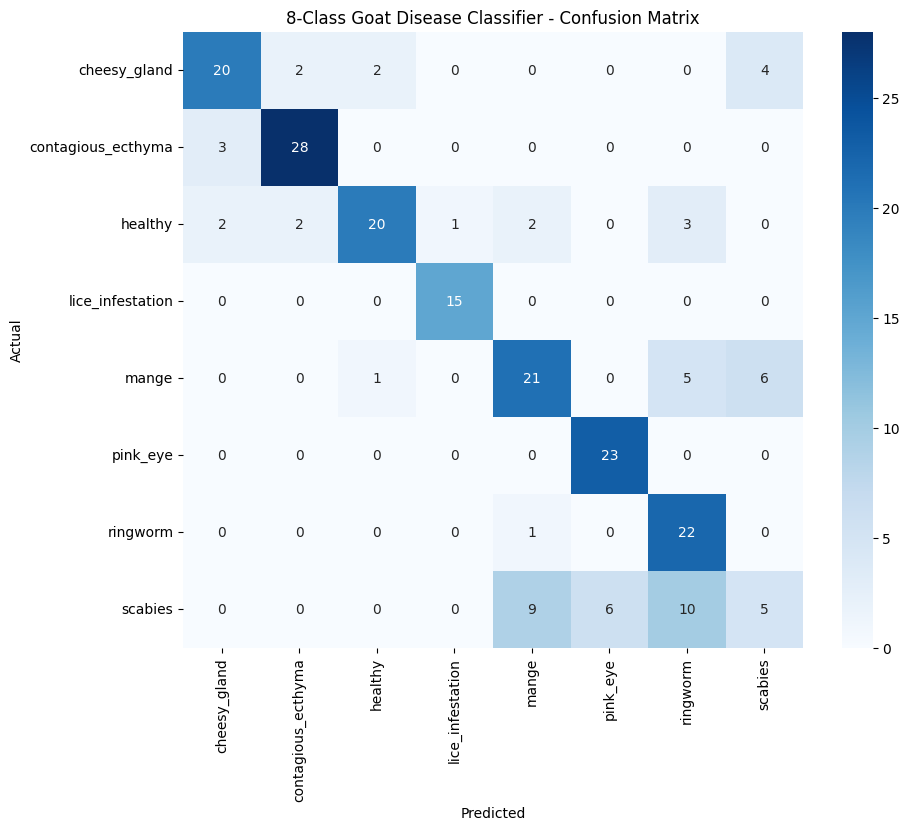

In [ ]:
model8_best = tf.keras.models.load_model('/content/goat_model_8class.keras')

test_loss8, test_acc8 = model8_best.evaluate(test_ds8)
print(f"Test accuracy: {test_acc8:.4f}\n")

y_true8, y_pred8 = [], []
for images, labels in test_ds8:
    preds = model8_best.predict(images, verbose=0)
    y_true8.extend(np.argmax(labels.numpy(), axis=1))
    y_pred8.extend(np.argmax(preds, axis=1))

y_true8 = np.array(y_true8)
y_pred8 = np.array(y_pred8)

print(classification_report(y_true8, y_pred8, target_names=class_names8))

cm8 = confusion_matrix(y_true8, y_pred8)
plt.figure(figsize=(10, 8))
sns.heatmap(cm8, annot=True, fmt='d', cmap='Blues', xticklabels=class_names8, yticklabels=class_names8)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('8-Class Goat Disease Classifier - Confusion Matrix')
plt.show()

In [4]:
from google.colab import files
import zipfile, os

uploaded = files.upload()  # select your combined zip
zip_filename = list(uploaded.keys())[0]
extract_path = '/content/goat_final4_raw'
with zipfile.ZipFile(zip_filename, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

for root, dirs, fs in os.walk(extract_path):
    level = root.replace(extract_path, '').count(os.sep)
    indent = '  ' * level
    print(f"{indent}{os.path.basename(root)}/")
    imgs = [f for f in fs if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if imgs:
        print(f"{indent}  ({len(imgs)} images)")

Saving Goat (4).zip to Goat (4).zip
goat_final4_raw/
  Goat/
    healthy/
      (422 images)
    Lice infestation/
      (57 images)
    pink eye/
      (354 images)
    cheesy gland/
      (751 images)
    Contagious ecthyma/
      (1183 images)


In [5]:
import re, random, shutil, os
from collections import defaultdict
from PIL import Image, ImageEnhance

random.seed(42)
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
splits = {'train': 0.8, 'val': 0.1, 'test': 0.1}

def get_base_id(filename):
    m_synth = re.match(r'^synth_(.+)_(\d+)\.(jpg|jpeg|png)$', filename, re.IGNORECASE)
    if m_synth:
        return m_synth.group(1)
    m = re.match(r'^(?:train|valid|test)_(.+?)(?:_aug\d+)?_jpg\.rf\.[0-9a-f]+\.jpg$', filename, re.IGNORECASE)
    if m:
        return m.group(1)
    return os.path.splitext(filename)[0]

def augment_image(img):
    if random.random() < 0.5:
        img = img.transpose(Image.FLIP_LEFT_RIGHT)
    angle = random.uniform(-20, 20)
    img = img.rotate(angle, expand=False, fillcolor=(0, 0, 0))
    img = ImageEnhance.Brightness(img).enhance(random.uniform(0.8, 1.2))
    img = ImageEnhance.Contrast(img).enhance(random.uniform(0.8, 1.2))
    return img

combined_root = '/content/goat_combined_final5'
if os.path.exists(combined_root):
    shutil.rmtree(combined_root)
os.makedirs(combined_root)

sources = {
    '/content/goat_final4_raw/Goat/cheesy gland': 'cheesy_gland',
    '/content/goat_final4_raw/Goat/healthy': 'healthy',
    '/content/goat_final4_raw/Goat/pink eye': 'pink_eye',
    '/content/goat_final4_raw/Goat/Contagious ecthyma': 'contagious_ecthyma',
    '/content/goat_final4_raw/Goat/Lice infestation': 'lice_infestation',
}
for src_dir, dest_name in sources.items():
    dest_dir = os.path.join(combined_root, dest_name)
    os.makedirs(dest_dir, exist_ok=True)
    for fname in os.listdir(src_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            shutil.copy(os.path.join(src_dir, fname), os.path.join(dest_dir, fname))

REAL_CAP_PER_GROUP = 8
TOTAL_CAP_PER_GROUP = 15
target_per_class = 350

final_balanced_root = '/content/goat_final5_balanced'
if os.path.exists(final_balanced_root):
    shutil.rmtree(final_balanced_root)
os.makedirs(final_balanced_root)

for class_name in sorted(os.listdir(combined_root)):
    class_dir = os.path.join(combined_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)
    group_ids = list(groups.keys())
    random.shuffle(group_ids)
    for gid in group_ids:
        random.shuffle(groups[gid])

    dest_dir = os.path.join(final_balanced_root, class_name)
    os.makedirs(dest_dir, exist_ok=True)
    selected_count = 0
    group_usage = {gid: 0 for gid in group_ids}
    idx = {gid: 0 for gid in group_ids}

    progress = True
    while selected_count < target_per_class and progress:
        progress = False
        for gid in group_ids:
            if selected_count >= target_per_class:
                break
            if group_usage[gid] >= REAL_CAP_PER_GROUP:
                continue
            i = idx[gid]
            if i < len(groups[gid]):
                fname = groups[gid][i]
                shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))
                idx[gid] += 1
                group_usage[gid] += 1
                selected_count += 1
                progress = True

    real_used = selected_count
    synthetic_count = 0
    if selected_count < target_per_class:
        group_cycle = list(group_ids)
        gi = 0
        attempts = 0
        max_attempts = target_per_class * 20
        while selected_count < target_per_class and attempts < max_attempts:
            attempts += 1
            gid = group_cycle[gi % len(group_cycle)]
            gi += 1
            if group_usage[gid] >= TOTAL_CAP_PER_GROUP:
                continue
            base_fname = groups[gid][0]
            try:
                img = Image.open(os.path.join(class_dir, base_fname)).convert('RGB')
            except Exception:
                continue
            aug_img = augment_image(img)
            synthetic_count += 1
            out_name = f"synth_{gid}_{synthetic_count}.jpg"
            aug_img.save(os.path.join(dest_dir, out_name), quality=90)
            group_usage[gid] += 1
            selected_count += 1

    print(f"{class_name}: {len(group_ids)} unique photos -> {real_used} real + {synthetic_count} synthetic = {selected_count} total")

final5_split_root = '/content/goat_final5_split'
if os.path.exists(final5_split_root):
    shutil.rmtree(final5_split_root)
for split_name in splits:
    os.makedirs(os.path.join(final5_split_root, split_name), exist_ok=True)

for class_name in sorted(os.listdir(final_balanced_root)):
    class_dir = os.path.join(final_balanced_root, class_name)
    if not os.path.isdir(class_dir):
        continue
    groups = defaultdict(list)
    for fname in os.listdir(class_dir):
        if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
            groups[get_base_id(fname)].append(fname)
    group_ids = list(groups.keys())
    random.shuffle(group_ids)
    total_images = sum(len(v) for v in groups.values())
    target_train = int(total_images * splits['train'])
    target_val = int(total_images * splits['val'])
    running_count = {'train': 0, 'val': 0, 'test': 0}
    for gid in group_ids:
        n = len(groups[gid])
        if running_count['train'] < target_train:
            dest_split = 'train'
        elif running_count['val'] < target_val:
            dest_split = 'val'
        else:
            dest_split = 'test'
        running_count[dest_split] += n
        dest_dir = os.path.join(final5_split_root, dest_split, class_name)
        os.makedirs(dest_dir, exist_ok=True)
        for fname in groups[gid]:
            shutil.copy(os.path.join(class_dir, fname), os.path.join(dest_dir, fname))
    print(f"{class_name}: {len(group_ids)} groups -> train={running_count['train']}, val={running_count['val']}, test={running_count['test']}")

leak_groups = defaultdict(set)
for split_name in ['train', 'val', 'test']:
    for class_name in os.listdir(os.path.join(final5_split_root, split_name)):
        class_dir = os.path.join(final5_split_root, split_name, class_name)
        if not os.path.isdir(class_dir):
            continue
        for fname in os.listdir(class_dir):
            leak_groups[(class_name, get_base_id(fname))].add(split_name)
leaked = {k: v for k, v in leak_groups.items() if len(v) > 1}
print(f"\nTotal source-image groups: {len(leak_groups)}")
print(f"Groups leaking across splits: {len(leaked)}")

cheesy_gland: 56 unique photos -> 279 real + 71 synthetic = 350 total
contagious_ecthyma: 122 unique photos -> 350 real + 0 synthetic = 350 total
healthy: 54 unique photos -> 336 real + 14 synthetic = 350 total
lice_infestation: 19 unique photos -> 57 real + 228 synthetic = 285 total
pink_eye: 26 unique photos -> 179 real + 171 synthetic = 350 total
cheesy_gland: 56 groups -> train=288, val=35, test=27
contagious_ecthyma: 122 groups -> train=283, val=36, test=31
healthy: 54 groups -> train=285, val=36, test=29
lice_infestation: 19 groups -> train=240, val=30, test=15
pink_eye: 26 groups -> train=283, val=44, test=23

Total source-image groups: 277
Groups leaking across splits: 0


In [6]:
from google.colab import drive
drive.mount('/content/drive')

import shutil

backup_dir = '/content/drive/MyDrive/PETDX_AI'
os.makedirs(backup_dir, exist_ok=True)

shutil.make_archive(os.path.join(backup_dir, 'goat_final5_split'), 'zip', final5_split_root)
print("Backup saved to:", os.path.join(backup_dir, 'goat_final5_split.zip'))

Mounted at /content/drive
Backup saved to: /content/drive/MyDrive/PETDX_AI/goat_final5_split.zip


In [8]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

train_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'train'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=True, seed=42
)
val_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'val'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)
test_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'test'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)

class_names5 = train_ds5.class_names
print("Final classes (label order):", class_names5)

data_augmentation = tf.keras.Sequential(name="data_augmentation")
data_augmentation.add(layers.RandomFlip('horizontal'))
data_augmentation.add(layers.RandomRotation(0.15))
data_augmentation.add(layers.RandomZoom(0.15))
data_augmentation.add(layers.RandomContrast(0.1))

preprocess_input = tf.keras.applications.efficientnet.preprocess_input

def prep_train(x, y):
    x = data_augmentation(x)
    x = preprocess_input(x)
    return x, y

def prep_eval(x, y):
    x = preprocess_input(x)
    return x, y

AUTOTUNE = tf.data.AUTOTUNE
train_ds5 = train_ds5.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds5 = val_ds5.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds5 = test_ds5.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Final 5-class pipelines ready.")

Found 1379 files belonging to 5 classes.
Found 181 files belonging to 5 classes.
Found 125 files belonging to 5 classes.
Final classes (label order): ['cheesy_gland', 'contagious_ecthyma', 'healthy', 'lice_infestation', 'pink_eye']
Final 5-class pipelines ready.


In [9]:
from tensorflow.keras import layers, models

base_model5 = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,), include_top=False, weights='imagenet'
)
base_model5.trainable = False

inputs5 = tf.keras.Input(shape=IMG_SIZE + (3,))
x5 = base_model5(inputs5, training=False)
x5 = layers.GlobalAveragePooling2D()(x5)
x5 = layers.Dropout(0.3)(x5)
x5 = layers.Dense(128, activation='relu')(x5)
x5 = layers.Dropout(0.2)(x5)
outputs5 = layers.Dense(len(class_names5), activation='softmax')(x5)

model5 = models.Model(inputs5, outputs5)
model5.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
               loss='categorical_crossentropy', metrics=['accuracy'])
model5.summary()

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [10]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

callbacks5 = [
    EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_final5.keras', monitor='val_accuracy', save_best_only=True)
]

history5 = model5.fit(
    train_ds5, validation_data=val_ds5, epochs=25,
    callbacks=callbacks5
)

Epoch 1/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - accuracy: 0.7912 - loss: 0.5788 - val_accuracy: 0.9171 - val_loss: 0.3403
Epoch 2/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 386ms/step - accuracy: 0.9311 - loss: 0.2099 - val_accuracy: 0.9337 - val_loss: 0.2836
Epoch 3/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 362ms/step - accuracy: 0.9529 - loss: 0.1388 - val_accuracy: 0.9061 - val_loss: 0.3186
Epoch 4/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 368ms/step - accuracy: 0.9717 - loss: 0.0966 - val_accuracy: 0.9282 - val_loss: 0.2617
Epoch 5/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 362ms/step - accuracy: 0.9724 - loss: 0.0859 - val_accuracy: 0.8895 - val_loss: 0.3042
Epoch 6/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 21s 373ms/step - accuracy: 0.9804 - loss: 0.0632 - val_accuracy: 0.8840 - val_loss: 0.3048
Epoch 7/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 364ms/step - accuracy: 0.9855 - loss: 0.0581 - val_accuracy: 0.8895 - val_loss: 0.2714
Epoch 8/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 16s 364ms/step - accuracy: 0.9804 - loss: 0.0577 - val_accurac

4/4 ━━━━━━━━━━━━━━━━━━━━ 14s 5s/step - accuracy: 0.8960 - loss: 0.6380
Test accuracy: 0.8960

                    precision    recall  f1-score   support

      cheesy_gland       1.00      0.78      0.88        27
contagious_ecthyma       0.83      0.97      0.90        31
           healthy       1.00      0.79      0.88        29
  lice_infestation       1.00      1.00      1.00        15
          pink_eye       0.77      1.00      0.87        23

          accuracy                           0.90       125
         macro avg       0.92      0.91      0.90       125
      weighted avg       0.92      0.90      0.90       125



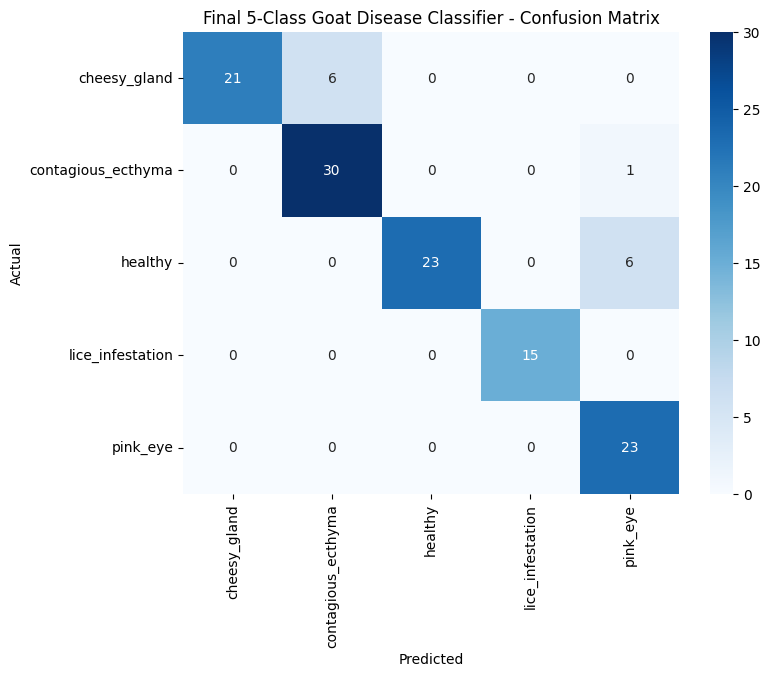

In [11]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

test_loss5, test_acc5 = model5.evaluate(test_ds5)
print(f"Test accuracy: {test_acc5:.4f}\n")

y_true5, y_pred5 = [], []
for images, labels in test_ds5:
    preds = model5.predict(images, verbose=0)
    y_true5.extend(np.argmax(labels.numpy(), axis=1))
    y_pred5.extend(np.argmax(preds, axis=1))

y_true5 = np.array(y_true5)
y_pred5 = np.array(y_pred5)

print(classification_report(y_true5, y_pred5, target_names=class_names5))

cm5 = confusion_matrix(y_true5, y_pred5)
plt.figure(figsize=(8, 6))
sns.heatmap(cm5, annot=True, fmt='d', cmap='Blues', xticklabels=class_names5, yticklabels=class_names5)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Final 5-Class Goat Disease Classifier - Confusion Matrix')
plt.show()

In [12]:
shutil.copy('/content/goat_model_final5.keras', '/content/drive/MyDrive/PETDX_AI/goat_model_final5.keras')
print("Saved to Drive.")

Saved to Drive.


Found 125 files belonging to 5 classes.


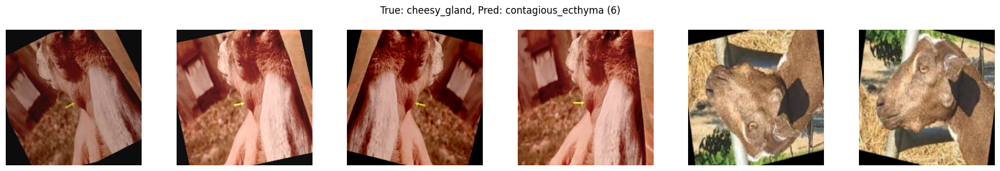

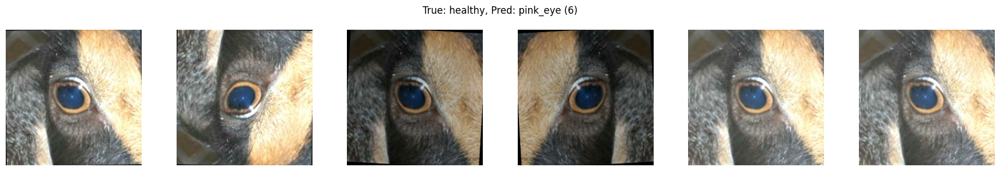

In [13]:
raw_test_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'test'),
    image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)

cg_idx = class_names5.index('cheesy_gland')
ce_idx = class_names5.index('contagious_ecthyma')
healthy_idx = class_names5.index('healthy')
pe_idx = class_names5.index('pink_eye')

cg_as_ce = []
healthy_as_pe = []

for (raw_images, labels), (proc_images, _) in zip(raw_test_ds5, test_ds5):
    preds = model5.predict(proc_images, verbose=0)
    true_labels = np.argmax(labels.numpy(), axis=1)
    pred_labels = np.argmax(preds, axis=1)
    for i in range(len(true_labels)):
        if true_labels[i] == cg_idx and pred_labels[i] == ce_idx:
            cg_as_ce.append(raw_images[i].numpy().astype('uint8'))
        elif true_labels[i] == healthy_idx and pred_labels[i] == pe_idx:
            healthy_as_pe.append(raw_images[i].numpy().astype('uint8'))

def show_grid(imgs, title):
    n = len(imgs)
    if n == 0:
        print(f"{title}: none found")
        return
    plt.figure(figsize=(3 * n, 3))
    for i in range(n):
        plt.subplot(1, n, i + 1)
        plt.imshow(imgs[i])
        plt.axis('off')
    plt.suptitle(f"{title} ({n})")
    plt.tight_layout()
    plt.show()

show_grid(cg_as_ce, "True: cheesy_gland, Pred: contagious_ecthyma")
show_grid(healthy_as_pe, "True: healthy, Pred: pink_eye")

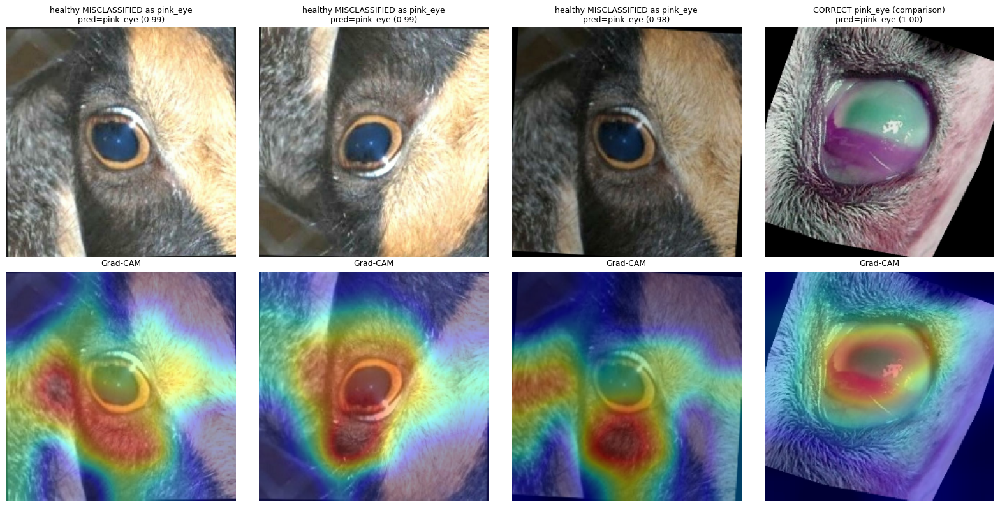

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

pe_idx = class_names5.index('pink_eye')

correct_pe_raw = None
for (raw_images, labels), (proc_images, _) in zip(raw_test_ds5, test_ds5):
    preds = model5.predict(proc_images, verbose=0)
    true_labels = np.argmax(labels.numpy(), axis=1)
    pred_labels = np.argmax(preds, axis=1)
    for i in range(len(true_labels)):
        if true_labels[i] == pe_idx and pred_labels[i] == pe_idx and correct_pe_raw is None:
            correct_pe_raw = raw_images[i].numpy().astype('uint8')
    if correct_pe_raw is not None:
        break

gap_layer = model5.get_layer('global_average_pooling2d')
dropout1 = model5.get_layer('dropout')
dense1 = model5.get_layer('dense')
dropout2 = model5.get_layer('dropout_1')
dense2 = model5.get_layer('dense_1')

def compute_gradcam(img_array_processed):
    img_array_processed = tf.expand_dims(img_array_processed, axis=0)
    with tf.GradientTape() as tape:
        conv_outputs = base_model5(img_array_processed, training=False)
        tape.watch(conv_outputs)
        x = gap_layer(conv_outputs)
        x = dropout1(x, training=False)
        x = dense1(x)
        x = dropout2(x, training=False)
        predictions = dense2(x)
        pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-8)
    return heatmap.numpy(), int(pred_index.numpy()), float(predictions[0][pred_index].numpy())

def overlay_heatmap(raw_img, heatmap, alpha=0.4):
    heatmap_resized = np.array(Image.fromarray(np.uint8(255 * heatmap)).resize((raw_img.shape[1], raw_img.shape[0])))
    heatmap_colored = plt.cm.jet(heatmap_resized / 255.0)[:, :, :3] * 255
    overlayed = (heatmap_colored * alpha + raw_img * (1 - alpha)).astype('uint8')
    return overlayed

samples = healthy_as_pe[:3] + ([correct_pe_raw] if correct_pe_raw is not None else [])
titles = ['healthy MISCLASSIFIED as pink_eye'] * min(3, len(healthy_as_pe)) + (['CORRECT pink_eye (comparison)'] if correct_pe_raw is not None else [])

plt.figure(figsize=(4 * len(samples), 8))
for idx, raw_img in enumerate(samples):
    proc_img = preprocess_input(tf.cast(raw_img, tf.float32))
    heatmap, pred_idx, conf = compute_gradcam(proc_img)
    overlay = overlay_heatmap(raw_img, heatmap)

    plt.subplot(2, len(samples), idx + 1)
    plt.imshow(raw_img)
    plt.title(f"{titles[idx]}\npred={class_names5[pred_idx]} ({conf:.2f})", fontsize=9)
    plt.axis('off')

    plt.subplot(2, len(samples), len(samples) + idx + 1)
    plt.imshow(overlay)
    plt.title("Grad-CAM", fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

Total unique healthy source photos: 54


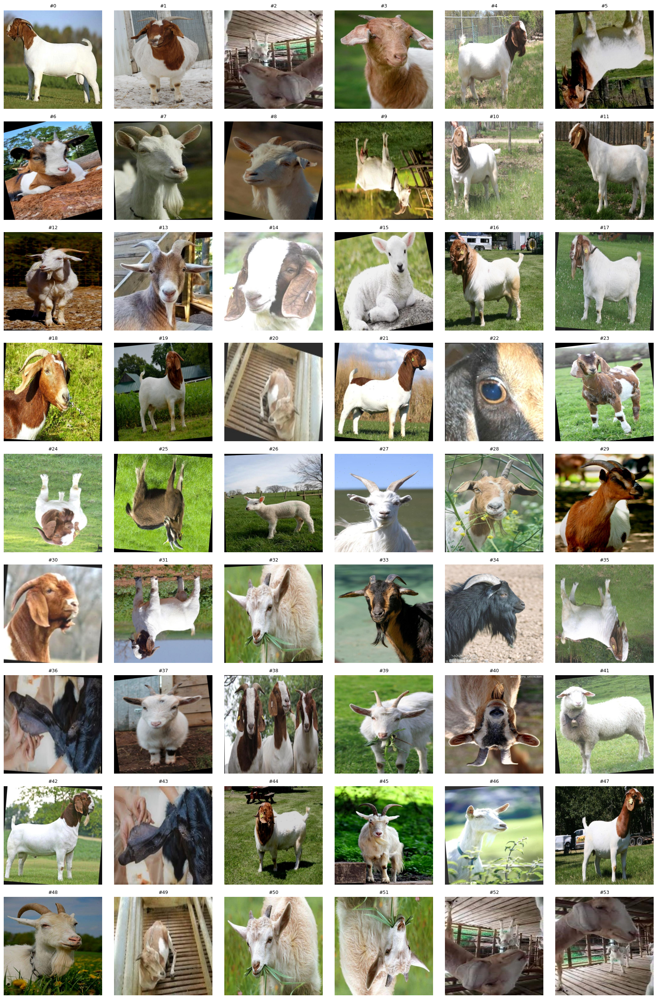

#0: train_89db66352cecde6e7a999425e3136c33_aug0_jpg.rf.08f9cd453818c3005072a209ad17d663.jpg
#1: test_4e9ac0082207176b5531e0c542cc9292_jpg.rf.31576e69359204de83362b1abe0d2ad9.jpg
#2: train_images-10-_aug0_jpg.rf.379dd4729b47646af4f8479a8a93ac31.jpg
#3: train_69d553eb974d61fdc97dbe322eb1eac0_aug0_jpg.rf.53ab446eddc723200e3d0986feb4d53e.jpg
#4: test_2019-4-22-IMG_2785-800x533-_jpg.rf.587ddc0302fddb46cb8466be55181aae.jpg
#5: train_2014-4-30-IMG_7568-2-Bear-Creek-BC-A580-Smok_aug0_jpg.rf.062dfad775a4bf87979d221e01f1a1c6.jpg
#6: train_6afb3bbffa3c958e2943d730009cfc62_aug0_jpg.rf.0b6ee114de6e7138ed58e52707008fb2.jpg
#7: train_444cffed205c35bea95ac6649988d863_aug0_jpg.rf.50db5e3a6c4b5eacebfc3d77d1385b4a.jpg
#8: train_93f2641e58d54d225fec02d404f6e257_aug0_jpg.rf.052c84e4a05a72814265289e4a9f4b63.jpg
#9: train_34ad0f178b37743f644e9c9ca4ebe3d2_aug0_jpg.rf.50e940844f286a53b68a5ab7e05e812b.jpg
#10: train_2015-5-31-IMG_2289-2-800x533-_aug0_jpg.rf.02a1834f502c474aac9e3b69eb5997bc.jpg
#11: train_2010-4

In [17]:
from collections import defaultdict
import matplotlib.pyplot as plt
from PIL import Image

healthy_dir = os.path.join(combined_root, 'healthy')
groups_healthy = defaultdict(list)
for fname in os.listdir(healthy_dir):
    if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        groups_healthy[get_base_id(fname)].append(fname)

representative_files = {gid: sorted(files)[0] for gid, files in groups_healthy.items()}
print(f"Total unique healthy source photos: {len(representative_files)}")

items = list(representative_files.items())
cols = 6
rows = (len(items) + cols - 1) // cols

plt.figure(figsize=(cols * 3, rows * 3))
for i, (gid, fname) in enumerate(items):
    img = Image.open(os.path.join(healthy_dir, fname))
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(f"#{i}", fontsize=9)
    plt.axis('off')
plt.tight_layout()
plt.show()

for i, (gid, fname) in enumerate(items):
    print(f"#{i}: {fname}")

In [18]:
import os, random
from PIL import Image, ImageEnhance
import shutil

random.seed(123)

def augment_image(img):
    if random.random() < 0.5:
        img = img.transpose(Image.FLIP_LEFT_RIGHT)
    angle = random.uniform(-20, 20)
    img = img.rotate(angle, expand=False, fillcolor=(0, 0, 0))
    img = ImageEnhance.Brightness(img).enhance(random.uniform(0.8, 1.2))
    img = ImageEnhance.Contrast(img).enhance(random.uniform(0.8, 1.2))
    return img

healthy_dir = os.path.join(combined_root, 'healthy')
groups_healthy = {}
for fname in os.listdir(healthy_dir):
    if fname.lower().endswith(('.jpg', '.jpeg', '.png')):
        gid = get_base_id(fname)
        groups_healthy.setdefault(gid, []).append(fname)

items = sorted(groups_healthy.items())
target_gid, raw_files_for_target = items[22]
print(f"Group '{target_gid}': {raw_files_for_target}")

N_SYNTHETIC = 20
train_healthy_dir = os.path.join(final5_split_root, 'train', 'healthy')
os.makedirs(train_healthy_dir, exist_ok=True)

for fname in raw_files_for_target:
    shutil.copy(os.path.join(healthy_dir, fname), os.path.join(train_healthy_dir, f"eyecrop_real_{fname}"))

count = 0
attempts = 0
while count < N_SYNTHETIC and attempts < N_SYNTHETIC * 5:
    attempts += 1
    base_fname = random.choice(raw_files_for_target)
    try:
        img = Image.open(os.path.join(healthy_dir, base_fname)).convert('RGB')
    except Exception:
        continue
    aug_img = augment_image(img)
    aug_img.save(os.path.join(train_healthy_dir, f"eyecrop_synth_{target_gid}_{count}.jpg"), quality=90)
    count += 1

total_now = len([f for f in os.listdir(train_healthy_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
print(f"Added {len(raw_files_for_target)} real + {count} synthetic eye-crop images")
print(f"New train/healthy total: {total_now}")

Group '4e9ac0082207176b5531e0c542cc9292': ['train_4e9ac0082207176b5531e0c542cc9292_aug2_jpg.rf.f201710c4cda3e99869f75479e5e15e0.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug0_jpg.rf.f4e4f43914a72adee1b65aece651e581.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug2_jpg.rf.4df48801f47e0e83917f240fedacf73b.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug0_jpg.rf.1c82c91efafe3cba881dc443d4311594.jpg', 'test_4e9ac0082207176b5531e0c542cc9292_jpg.rf.31576e69359204de83362b1abe0d2ad9.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug1_jpg.rf.d6df298150b9be19a50a917204e9d5ae.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug1_jpg.rf.cca22ad54abbff2b155a7647c6d7091f.jpg']
Added 7 real + 20 synthetic eye-crop images
New train/healthy total: 312


In [19]:
target_gid = '4e9ac0082207176b5531e0c542cc9292'

locations = {}
for split_name in ['train', 'val', 'test']:
    split_healthy_dir = os.path.join(final5_split_root, split_name, 'healthy')
    matches = [f for f in os.listdir(split_healthy_dir) if get_base_id(f) == target_gid]
    if matches:
        locations[split_name] = matches

print("Group found in:", list(locations.keys()))
for split_name, files in locations.items():
    print(f"  {split_name}: {files}")

# If it exists in val or test, remove those copies — this photo can only live in ONE split
for split_name in ['val', 'test']:
    if split_name in locations:
        split_healthy_dir = os.path.join(final5_split_root, split_name, 'healthy')
        for fname in locations[split_name]:
            os.remove(os.path.join(split_healthy_dir, fname))
        print(f"Removed {len(locations[split_name])} file(s) from {split_name} to prevent leakage")

Group found in: ['train']
  train: ['train_4e9ac0082207176b5531e0c542cc9292_aug2_jpg.rf.f201710c4cda3e99869f75479e5e15e0.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug0_jpg.rf.f4e4f43914a72adee1b65aece651e581.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug2_jpg.rf.4df48801f47e0e83917f240fedacf73b.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug0_jpg.rf.1c82c91efafe3cba881dc443d4311594.jpg', 'test_4e9ac0082207176b5531e0c542cc9292_jpg.rf.31576e69359204de83362b1abe0d2ad9.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug1_jpg.rf.d6df298150b9be19a50a917204e9d5ae.jpg', 'train_4e9ac0082207176b5531e0c542cc9292_aug1_jpg.rf.cca22ad54abbff2b155a7647c6d7091f.jpg']


In [20]:
train_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'train'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=True, seed=42
)
val_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'val'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)
test_ds5 = tf.keras.utils.image_dataset_from_directory(
    os.path.join(final5_split_root, 'test'), image_size=IMG_SIZE, batch_size=BATCH_SIZE,
    label_mode='categorical', shuffle=False
)

class_names5 = train_ds5.class_names
print("Classes (label order):", class_names5)

train_ds5 = train_ds5.map(prep_train, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds5 = val_ds5.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds5 = test_ds5.map(prep_eval, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

print("Pipelines rebuilt with eye-crop counter-examples.")

Found 1406 files belonging to 5 classes.
Found 181 files belonging to 5 classes.
Found 125 files belonging to 5 classes.
Classes (label order): ['cheesy_gland', 'contagious_ecthyma', 'healthy', 'lice_infestation', 'pink_eye']
Pipelines rebuilt with eye-crop counter-examples.


In [21]:
base_model5 = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,), include_top=False, weights='imagenet'
)
base_model5.trainable = False

inputs5 = tf.keras.Input(shape=IMG_SIZE + (3,))
x5 = base_model5(inputs5, training=False)
x5 = layers.GlobalAveragePooling2D()(x5)
x5 = layers.Dropout(0.3)(x5)
x5 = layers.Dense(128, activation='relu')(x5)
x5 = layers.Dropout(0.2)(x5)
outputs5 = layers.Dense(len(class_names5), activation='softmax')(x5)

model5 = models.Model(inputs5, outputs5)
model5.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
               loss='categorical_crossentropy', metrics=['accuracy'])
model5.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,214,184 (16.08 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

In [22]:
callbacks5 = [
    EarlyStopping(monitor='val_accuracy', patience=6, restore_best_weights=True),
    ModelCheckpoint('/content/goat_model_final5_v2.keras', monitor='val_accuracy', save_best_only=True)
]

history5 = model5.fit(
    train_ds5, validation_data=val_ds5, epochs=25,
    callbacks=callbacks5
)

Epoch 1/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.7888 - loss: 0.5777 - val_accuracy: 0.9171 - val_loss: 0.3649
Epoch 2/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 18s 399ms/step - accuracy: 0.9417 - loss: 0.1913 - val_accuracy: 0.9116 - val_loss: 0.3529
Epoch 3/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 379ms/step - accuracy: 0.9573 - loss: 0.1259 - val_accuracy: 0.9171 - val_loss: 0.3262
Epoch 4/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 375ms/step - accuracy: 0.9730 - loss: 0.0816 - val_accuracy: 0.9061 - val_loss: 0.2840
Epoch 5/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 371ms/step - accuracy: 0.9708 - loss: 0.0843 - val_accuracy: 0.9116 - val_loss: 0.2815
Epoch 6/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 17s 386ms/step - accuracy: 0.9751 - loss: 0.0762 - val_accuracy: 0.9116 - val_loss: 0.2414
Epoch 7/25
44/44 ━━━━━━━━━━━━━━━━━━━━ 20s 380ms/step - accuracy: 0.9751 - loss: 0.0670 - val_accuracy: 0.9171 - val_loss: 0.2529


4/4 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.8640 - loss: 0.5868
Test accuracy: 0.8640

                    precision    recall  f1-score   support

      cheesy_gland       1.00      0.74      0.85        27
contagious_ecthyma       0.79      0.87      0.83        31
           healthy       0.92      0.79      0.85        29
  lice_infestation       1.00      1.00      1.00        15
          pink_eye       0.74      1.00      0.85        23

          accuracy                           0.86       125
         macro avg       0.89      0.88      0.88       125
      weighted avg       0.88      0.86      0.86       125



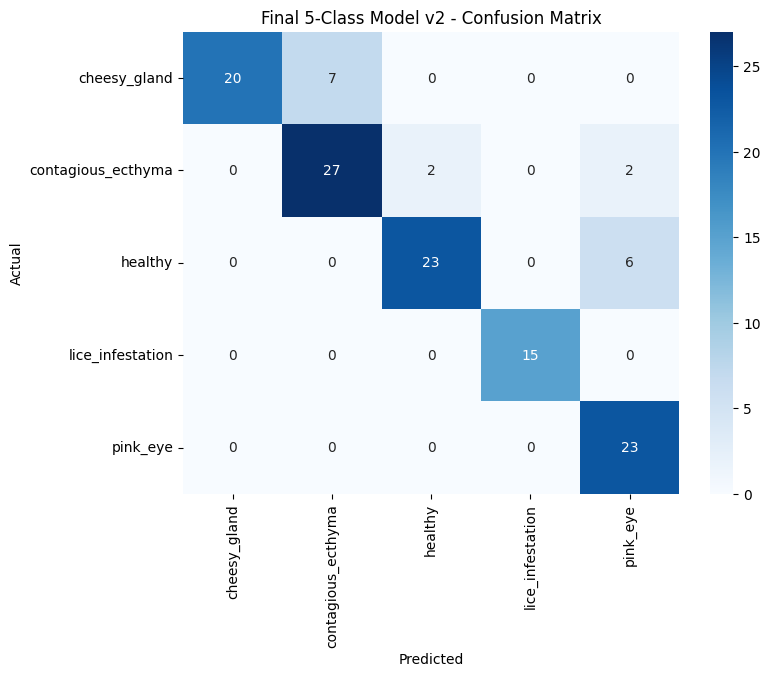

In [23]:
model5_best = tf.keras.models.load_model('/content/goat_model_final5_v2.keras')

test_loss5, test_acc5 = model5_best.evaluate(test_ds5)
print(f"Test accuracy: {test_acc5:.4f}\n")

y_true5, y_pred5 = [], []
for images, labels in test_ds5:
    preds = model5_best.predict(images, verbose=0)
    y_true5.extend(np.argmax(labels.numpy(), axis=1))
    y_pred5.extend(np.argmax(preds, axis=1))

y_true5 = np.array(y_true5)
y_pred5 = np.array(y_pred5)

print(classification_report(y_true5, y_pred5, target_names=class_names5))

cm5 = confusion_matrix(y_true5, y_pred5)
plt.figure(figsize=(8, 6))
sns.heatmap(cm5, annot=True, fmt='d', cmap='Blues', xticklabels=class_names5, yticklabels=class_names5)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Final 5-Class Model v2 - Confusion Matrix')
plt.show()

In [24]:
import shutil

# v1 is still on disk from before (goat_model_final5.keras) — just confirm and back it up
final_model_path = '/content/goat_model_final5.keras'
print("v1 model exists:", os.path.exists(final_model_path))

drive_backup_dir = '/content/drive/MyDrive/PETDX_AI'
os.makedirs(drive_backup_dir, exist_ok=True)
shutil.copy(final_model_path, os.path.join(drive_backup_dir, 'goat_model_FINAL.keras'))
print("Saved final model to Drive.")

v1 model exists: True
Saved final model to Drive.


In [25]:
# Load the final model fresh (in case this is a new session)
final_model = tf.keras.models.load_model('/content/goat_model_final5.keras')

# Convert to TFLite with dynamic range quantization (smaller file, minimal accuracy loss)
converter = tf.lite.TFLiteConverter.from_keras_model(final_model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()

tflite_path = '/content/goat_disease_model.tflite'
with open(tflite_path, 'wb') as f:
    f.write(tflite_model)

print(f"TFLite model saved: {tflite_path}")
print(f"File size: {os.path.getsize(tflite_path) / (1024*1024):.2f} MB")

# Save labels in the exact order the model outputs them (critical for correct app predictions)
labels_path = '/content/goat_disease_labels.txt'
with open(labels_path, 'w') as f:
    for label in class_names5:
        f.write(label + '\n')

print(f"\nLabels saved: {labels_path}")
print("Order:", class_names5)

Saved artifact at '/tmp/tmp3prjg4ff'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_2')
Output Type:
  TensorSpec(shape=(None, 5), dtype=tf.float32, name=None)
Captures:
  138274405161040: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138274405158352: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  138274408635216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408635600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408635024: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408633872: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408635408: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408639632: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408634064: TensorSpec(shape=(), dtype=tf.resource, name=None)
  138274408631760: TensorSpec(shape=(), dtype=tf.resource, name=Non

In [26]:
import numpy as np

interpreter = tf.lite.Interpreter(model_path=tflite_path)
interpreter.allocate_tensors()
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

print("Input shape expected:", input_details[0]['shape'])
print("Input dtype expected:", input_details[0]['dtype'])

matches = 0
total = 0

for images, labels in test_ds5.take(3):  # a few batches
    keras_preds = final_model.predict(images, verbose=0)
    for i in range(images.shape[0]):
        img = np.expand_dims(images[i].numpy(), axis=0).astype(np.float32)
        interpreter.set_tensor(input_details[0]['index'], img)
        interpreter.invoke()
        tflite_pred = interpreter.get_tensor(output_details[0]['index'])[0]

        keras_class = np.argmax(keras_preds[i])
        tflite_class = np.argmax(tflite_pred)

        matches += int(keras_class == tflite_class)
        total += 1

print(f"\nAgreement: {matches}/{total} predictions match between Keras and TFLite")

/usr/local/lib/python3.13/dist-packages/tensorflow/lite/python/interpreter.py:457: UserWarning:     Warning: tf.lite.Interpreter is deprecated and is scheduled for deletion in
    TF 2.20. Please use the LiteRT interpreter from the ai_edge_litert package.
    See the [migration guide](https://ai.google.dev/edge/litert/migration)
    for details.
    
  warnings.warn(_INTERPRETER_DELETION_WARNING)


Input shape expected: [  1 224 224   3]
Input dtype expected: <class 'numpy.float32'>

Agreement: 95/96 predictions match between Keras and TFLite


In [27]:
shutil.copy(tflite_path, os.path.join(drive_backup_dir, 'goat_disease_model.tflite'))
shutil.copy(labels_path, os.path.join(drive_backup_dir, 'goat_disease_labels.txt'))
print("TFLite model and labels backed up to Drive.")

TFLite model and labels backed up to Drive.


In [28]:
from google.colab import files

files.download('/content/goat_disease_model.tflite')
files.download('/content/goat_disease_labels.txt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>